# Data Science in image classification - Dog breeds 



## Data Science Workshop
Students: Eran Kayat & Andrey Katunin

Who's a good dog? Who likes ear scratches? Well, it seems those fancy deep neural networks don't have all the answers. 
However, maybe they can answer that ubiquitous question we all ask when meeting a four-legged stranger: what kind of good pup is that?

Hello, we are Eran and Andrey and we are doing our project on dogs breed identification.
 For a little background, from a young age we both had a big love for two things: computers and our dogs.
 When we started working together, we thought this project would be a good opportunity to combine the two. 

We found two datasets of images of dogs. Each image has a filename that is its unique id. The two datasets comprises 120 breeds of dogs. 
The goal of the project is to create a classifier capable of determining a dog's breed from a photo.

We think we can create an application that will allow you to take a picture and the app will tell you what kind of dogs it is. <br>
We all now that feeling where see a dog and we dont now the specific breed.

Also some dogs are illegal having a model that recognizes dog breeds can help local authorities enforce the law

# Data Gathering 

We downloaded 2 dog breed image data sets. One from  kaggle and the other from Stanford and uploaded them to ourGoogle drive

In [24]:
#from google.colab import drive
# drive.mount('/content/drive')

We will now unzip our images

In [25]:
# import requests, zipfile, io

# z = zipfile.ZipFile('/content/drive/MyDrive/data/Images.zip')
# z.extractall()
# z = zipfile.ZipFile('/content/drive/MyDrive/data/dog-breed-identification.zip')
# z.extractall()


# Data Preperation

In [1]:
# functions we will later use to put our images in certain directories
import os, shutil

def mkdirIfNotExist(directory):
    if not os.path.exists(directory):
        os.mkdir(directory)
    return directory
def copyIfNotExist(fnames, src_dir, dst_dir):
    nCopied = 0
    for fname in fnames:
        src = fname
        dst = os.path.join(dst_dir, fname.split("/")[1]) # 4 ON COLAB
        if not os.path.exists(dst):
            shutil.copyfile(src, dst)
            nCopied += 1
    if nCopied > 0:
        print("Copied %d to %s" % (nCopied, dst_dir))

In [2]:
# # Path variables colab
# STANFORD_PATH = '/content/Images'
# KAGGLE_PATH = '/content/dog-breed-identification/train'
# KAGGLE_LABEL_PATH = '/content/dog-breed-identification/labels.csv'
# VALID_PATH = mkdirIfNotExist('/content/validtation')
# TRAIN_PATH = mkdirIfNotExist('/content/train')

In [21]:
# Path variables windows
STANFORD_PATH = r'C:\content\Images'
KAGGLE_PATH = r'C:\content\dog-breed-identification\train'
KAGGLE_LABEL_PATH = r'C:\content\dog-breed-identification\labels.csv'
VALID_PATH = mkdirIfNotExist(r'C:\content\validtation')
TRAIN_PATH = mkdirIfNotExist(r'C:\content\train')

Imports of the libraries we are going to use for our task

In [4]:
import pandas as pd
import webbrowser, os
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
import os
import random
import math
#import skimage.io
import sklearn
import cv2
from sklearn import metrics
from sklearn.metrics import confusion_matrix, classification_report
sns.set()
pd.set_option('display.expand_frame_repr', False)

Now our images are in 2 different directories and the image structure is different.
We want to merge our datasets into one and continue from there

In [5]:
import warnings
warnings.filterwarnings('ignore')

We dont want to see any warnings

## Kaggle Dataset

Lets start with the data set from kaggle and load it

In [6]:
df_labels_kaggle = pd.read_csv(KAGGLE_LABEL_PATH)
df_labels_kaggle

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever
...,...,...
10217,ffd25009d635cfd16e793503ac5edef0,borzoi
10218,ffd3f636f7f379c51ba3648a9ff8254f,dandie_dinmont
10219,ffe2ca6c940cddfee68fa3cc6c63213f,airedale
10220,ffe5f6d8e2bff356e9482a80a6e29aac,miniature_pinscher


We can see that in this data set we have 10221 rows and that each row contains the id of the image and the name of the dog breed

## Stanford Dataset

Now we will load our Stanford data set

In [7]:
import os
# Creating an empty dataset of id and breed to match the kaggle data set
df_stanford = pd.DataFrame(columns=['id','breed'])
list_of_names= []

# Iterate over a dir and add all the file names to a list
def listdir(dir):
    temp_list = []
    filenames = os.listdir(dir)
    for files in filenames:
        temp_list.append(files)
    return temp_list

list_of_names = listdir(STANFORD_PATH)
# Add all the individual dog breed names to one data set
for name in list_of_names:
  list_dog_in_breed = []
  list_dog_in_breed = listdir(STANFORD_PATH + '/' + name)
  clean_dog_name = name.split('-',1)[1].lower()
  for dog_name in list_dog_in_breed:
    df_stanford = df_stanford.append({'id': dog_name.split('.')[0],'breed': clean_dog_name}, ignore_index=True)

df_stanford

,id,breed
0,n02085620_10074,chihuahua
1,n02085620_10131,chihuahua
2,n02085620_10621,chihuahua
3,n02085620_1073,chihuahua
4,n02085620_10976,chihuahua
...,...,...
20575,n02116738_9798,african_hunting_dog
20576,n02116738_9818,african_hunting_dog
20577,n02116738_9829,african_hunting_dog
20578,n02116738_9844,african_hunting_dog


We can see now that we created a dataframe from the Stanford directories.


We have 20579 entries that each has an id and dog breed name

## Merging the Datasets

Now we will merge the two datasets to one using an outer join 

In [8]:
df = df_stanford.merge(df_labels_kaggle,how='outer')
df

,id,breed
0,n02085620_10074,chihuahua
1,n02085620_10131,chihuahua
2,n02085620_10621,chihuahua
3,n02085620_1073,chihuahua
4,n02085620_10976,chihuahua
...,...,...
30797,ffd25009d635cfd16e793503ac5edef0,borzoi
30798,ffd3f636f7f379c51ba3648a9ff8254f,dandie_dinmont
30799,ffe2ca6c940cddfee68fa3cc6c63213f,airedale
30800,ffe5f6d8e2bff356e9482a80a6e29aac,miniature_pinscher


After the merger we have  30802 rows

# EDA

## Data Exploration

Lets see how many labels we have

In [9]:
labels_names=df["breed"].unique()
labels_sorted=labels_names.sort()

labels = dict(zip(range(len(labels_names)),labels_names))
labels 

{0: 'affenpinscher',
 1: 'afghan_hound',
 2: 'african_hunting_dog',
 3: 'airedale',
 4: 'american_staffordshire_terrier',
 5: 'appenzeller',
 6: 'australian_terrier',
 7: 'basenji',
 8: 'basset',
 9: 'beagle',
 10: 'bedlington_terrier',
 11: 'bernese_mountain_dog',
 12: 'black-and-tan_coonhound',
 13: 'blenheim_spaniel',
 14: 'bloodhound',
 15: 'bluetick',
 16: 'border_collie',
 17: 'border_terrier',
 18: 'borzoi',
 19: 'boston_bull',
 20: 'bouvier_des_flandres',
 21: 'boxer',
 22: 'brabancon_griffon',
 23: 'briard',
 24: 'brittany_spaniel',
 25: 'bull_mastiff',
 26: 'cairn',
 27: 'cardigan',
 28: 'chesapeake_bay_retriever',
 29: 'chihuahua',
 30: 'chow',
 31: 'clumber',
 32: 'cocker_spaniel',
 33: 'collie',
 34: 'curly-coated_retriever',
 35: 'dandie_dinmont',
 36: 'dhole',
 37: 'dingo',
 38: 'doberman',
 39: 'english_foxhound',
 40: 'english_setter',
 41: 'english_springer',
 42: 'entlebucher',
 43: 'eskimo_dog',
 44: 'flat-coated_retriever',
 45: 'french_bulldog',
 46: 'german_sheph

We can see that we have 120 different dog breeds

Lets give each breed a label

In [10]:
lbl=[]
for i in range(len(df["breed"])):
    temp=list(labels.values()).index(df.breed[i])
    lbl.append(temp)

    
df['lbl'] = lbl
df

,id,breed,lbl
0,n02085620_10074,chihuahua,29
1,n02085620_10131,chihuahua,29
2,n02085620_10621,chihuahua,29
3,n02085620_1073,chihuahua,29
4,n02085620_10976,chihuahua,29
...,...,...,...
30797,ffd25009d635cfd16e793503ac5edef0,borzoi,18
30798,ffd3f636f7f379c51ba3648a9ff8254f,dandie_dinmont,35
30799,ffe2ca6c940cddfee68fa3cc6c63213f,airedale,3
30800,ffe5f6d8e2bff356e9482a80a6e29aac,miniature_pinscher,75


Now for each dog in the data set lets add a path to the image

In [11]:
path_img=[]
for i in range(len(df["id"])):
    temp=KAGGLE_PATH + "/" + str(df.id[i]) + ".jpg"
    path_img.append(temp)

df['path_img'] =path_img
df.head()

,id,breed,lbl,path_img
0,n02085620_10074,chihuahua,29,C:\content\dog-breed-identification\train/n020...
1,n02085620_10131,chihuahua,29,C:\content\dog-breed-identification\train/n020...
2,n02085620_10621,chihuahua,29,C:\content\dog-breed-identification\train/n020...
3,n02085620_1073,chihuahua,29,C:\content\dog-breed-identification\train/n020...
4,n02085620_10976,chihuahua,29,C:\content\dog-breed-identification\train/n020...


In [12]:
df

,id,breed,lbl,path_img
0,n02085620_10074,chihuahua,29,C:\content\dog-breed-identification\train/n020...
1,n02085620_10131,chihuahua,29,C:\content\dog-breed-identification\train/n020...
2,n02085620_10621,chihuahua,29,C:\content\dog-breed-identification\train/n020...
3,n02085620_1073,chihuahua,29,C:\content\dog-breed-identification\train/n020...
4,n02085620_10976,chihuahua,29,C:\content\dog-breed-identification\train/n020...
...,...,...,...,...
30797,ffd25009d635cfd16e793503ac5edef0,borzoi,18,C:\content\dog-breed-identification\train/ffd2...
30798,ffd3f636f7f379c51ba3648a9ff8254f,dandie_dinmont,35,C:\content\dog-breed-identification\train/ffd3...
30799,ffe2ca6c940cddfee68fa3cc6c63213f,airedale,3,C:\content\dog-breed-identification\train/ffe2...
30800,ffe5f6d8e2bff356e9482a80a6e29aac,miniature_pinscher,75,C:\content\dog-breed-identification\train/ffe5...


Lets look at what data we have

In [13]:
num_images = len(df["id"])
print('Number of images in Training file:', num_images)
num_labels=len(labels_names)
print('Number of dog breeds in Training file:', num_labels)

Number of images in Training file: 30802
Number of dog breeds in Training file: 120


We have 30802 images split amongst 120 categores <br>
Now lets check the distribution.

Droping rows we dont have labeling for(152 images dropped)

In [14]:
count = 0
for pat in df['path_img']:
  if not os.path.exists(pat):
    df.drop(df[df.path_img == pat].index, inplace=True)
    count = count+1
count

152

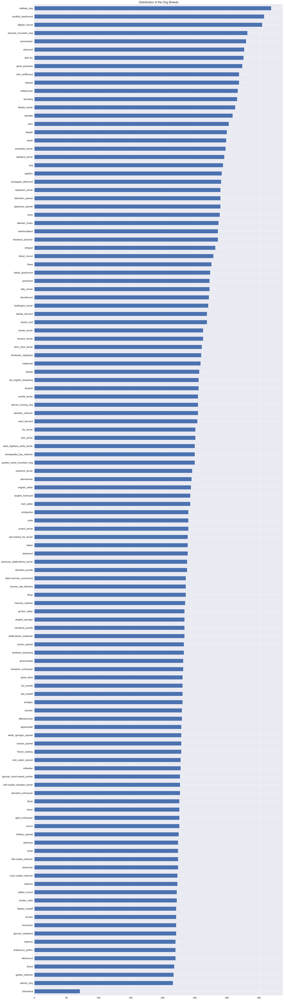

In [15]:
bar = df["breed"].value_counts(ascending=True).plot.barh(figsize = (30,120))
plt.title("Distribution of the Dog Breeds", fontsize = 20)
bar.tick_params(labelsize=16)
plt.show()

In [16]:
df["breed"].value_counts(ascending=False)


maltese_dog             369
scottish_deerhound      358
afghan_hound            355
bernese_mountain_dog    332
pomeranian              330
                       ... 
redbone                 220
briard                  218
golden_retriever        217
eskimo_dog              216
chihuahua                71
Name: breed, Length: 120, dtype: int64

We can see the some categories contain much less data than the other ones.
This might affect the accuracy of the model.
We will leave it for now and maybe look for more data later.

100%|██████████████████████████████████████████████████████████████████████████| 30650/30650 [00:08<00:00, 3502.85it/s]


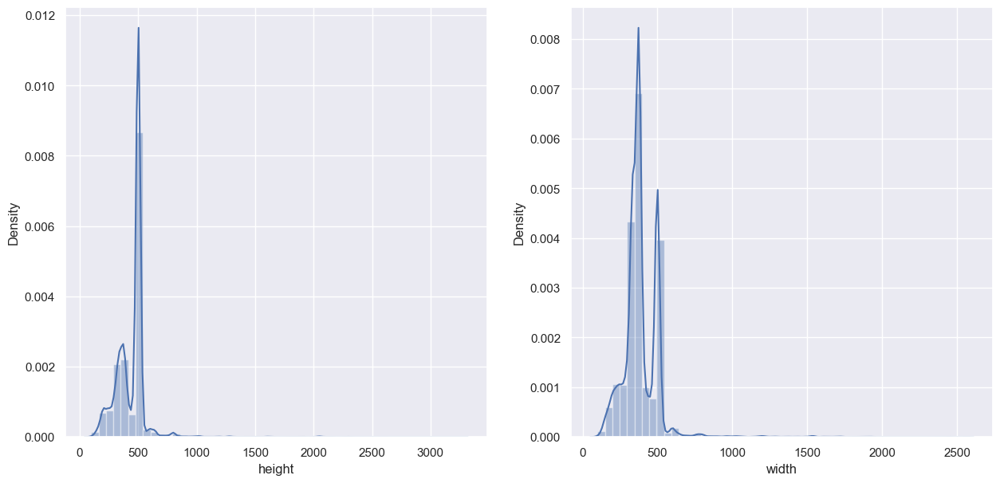

In [17]:
import PIL
def get_image_dim(image_id):
      image = PIL.Image.open(f"{image_id}")
      width,height = image.size
      return (width,height)
    

tqdm.pandas()
df['image_dim'] = df['path_img'].progress_apply(get_image_dim)
df['height'] = df['image_dim'].apply(lambda x: x[0])
df['width'] = df['image_dim'].apply(lambda x: x[1])

fig, axis = plt.subplots(1, 2, figsize=(15,7))
sns.distplot(df['height'], ax=axis[0])
sns.distplot(df['width'], ax=axis[1])
plt.show()

We can see that the resolution of the images is not to high and that the distrubution is around 400 for both sides

## Image Analysis

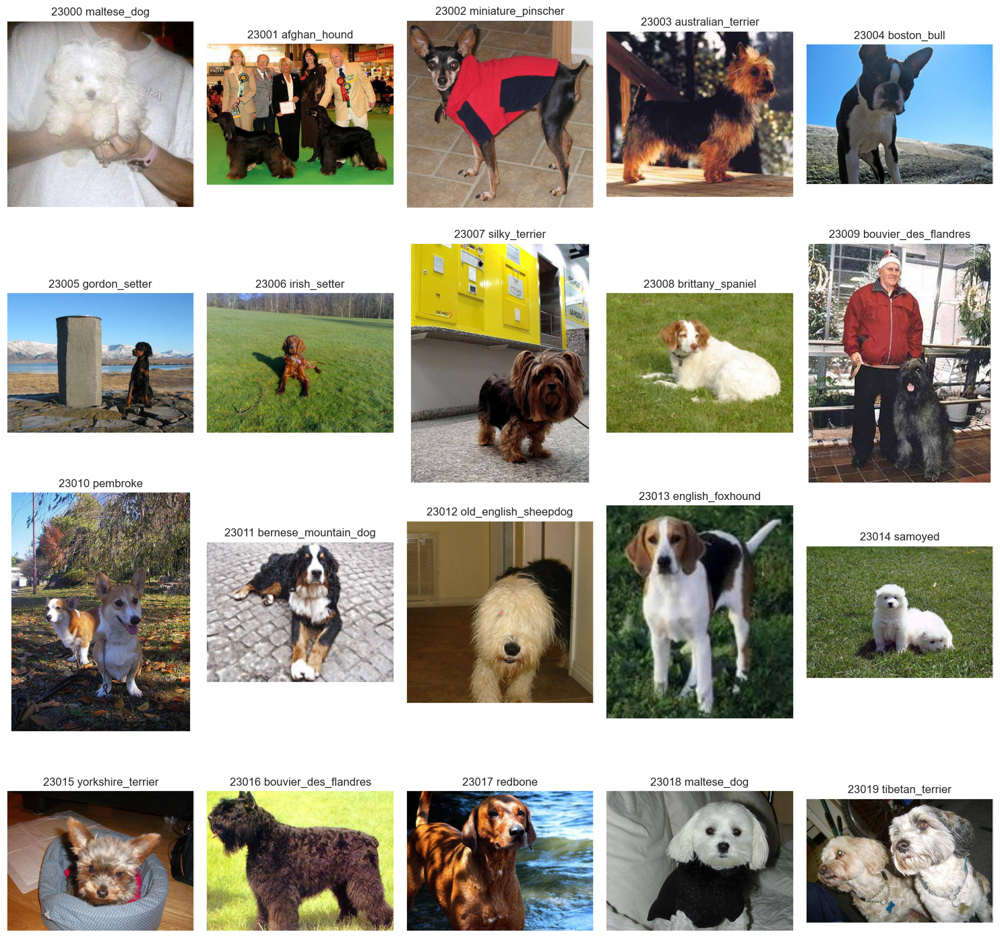

In [18]:
fig, axes = plt.subplots(nrows=4, ncols=5, figsize=(15, 15),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat,23000):
    ax.imshow(plt.imread(df.path_img[i]))
    ax.set_title(str(i) +" "+ df.breed[i])
plt.tight_layout()
plt.show()

Populating the interactive namespace from numpy and matplotlib


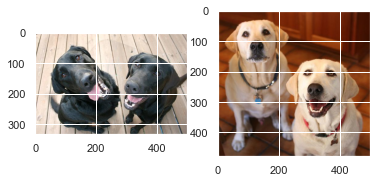

In [19]:
%pylab inline
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

f = plt.figure()
f.add_subplot(1,2, 1)
plt.imshow(mpimg.imread(f"{STANFORD_PATH}/n02099712-Labrador_retriever/n02099712_2224.jpg"))
f.add_subplot(1,2, 2)
plt.imshow(mpimg.imread(f"{STANFORD_PATH}/n02099712-Labrador_retriever/n02099712_5000.jpg"))
plt.show(block=True)

As we can see from the pictures above, these dogs are the same breed but the colors of the dogs and their positioning might confuse the algorithems to classify them correctly.

Lets take a look at two other images

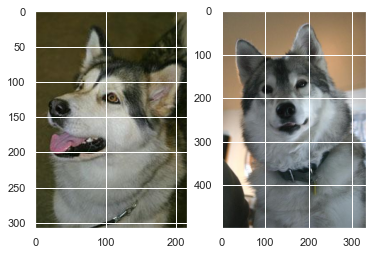

In [20]:
f = plt.figure()
f.add_subplot(1,2, 1)
plt.imshow(mpimg.imread(f"{STANFORD_PATH}/n02110063-malamute/n02110063_609.jpg"))
f.add_subplot(1,2, 2)
plt.imshow(mpimg.imread(f"{STANFORD_PATH}/n02110185-Siberian_husky/n02110185_4677.jpg"))
plt.show(block=True)

This time, the pictures are of two diffrent breeds but they look very alike, so the algorithms might get the classification wrong and decide they are the same breed.

# Classifcal Machine Learning

## Multinomial Naive Bayes

Now we will create a copy of this df to perform feature extraction

In [23]:
 df_classification = df

Drop the id and breed as those are not relevant featrues

In [24]:
df_classification = df_classification.drop(columns = ["id","breed"])
df_classification.reset_index(inplace=True)

Now we will convert images to vector features using opencv and then try to classify the images using MultinomialNB


In [27]:
SIZE = 128 # Resizing images
new_df = pd.DataFrame()
for index, row in df_classification.iterrows(): # iterating over all the images
    img = cv2.imread(row["path_img"], cv2.IMREAD_COLOR) #Reading color images
    img = cv2.resize(img, (SIZE, SIZE)) #Resize images
    x = img.reshape(-1)
    new_df = new_df.append(pd.DataFrame(x).T,ignore_index=True)

new_df is a data frame with the pixels as the columns

Now that we have all the images as pixel verctor we can start using classification algoritms

In [28]:
from sklearn.utils import shuffle
new_df['lbl'] = df_classification['lbl']
new_df = shuffle(new_df)
new_df.reset_index(inplace=True)
X = new_df.drop(['index','lbl'], axis=1)
y = new_df['lbl']

Here we defined our features and labels (X,y)

Spliting the data into train and test

In [35]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

Because we dont have enough memory to train on the whole data we need use algos that support partial fit
This why we decided to start with MultinomialNB.

In [36]:
from sklearn.naive_bayes import MultinomialNB
clf = MultinomialNB()

Now we are iterating over our train data dividing the pixel values by 255 so they will be normalized and then partially fitting the data

In [37]:
classes = list(range(0, 119))
for i in range(len(X_train)//100):
    x_partial = X_train[i*(len(X_train)//100) : (i+1)*(len(X_train)//100)]
    y_partial = y_train[i*(len(y_train)//100) : (i+1)*(len(y_train)//100)]
    if len(x_partial) == 0 :
        break
    x_partial = x_partial.div(255)
    clf.partial_fit(x_partial, y_partial,classes = classes)

getting our predicitions

In [38]:
predicitions = clf.predict(X_test.div(255))

In [ ]:
print ("Accuracy = ", metrics.accuracy_score(y_test, predicitions))

Accuracy =  0.04489103484275088


We can see that we got about 4.5% accuracy on test data, its very low and will not suite a production application

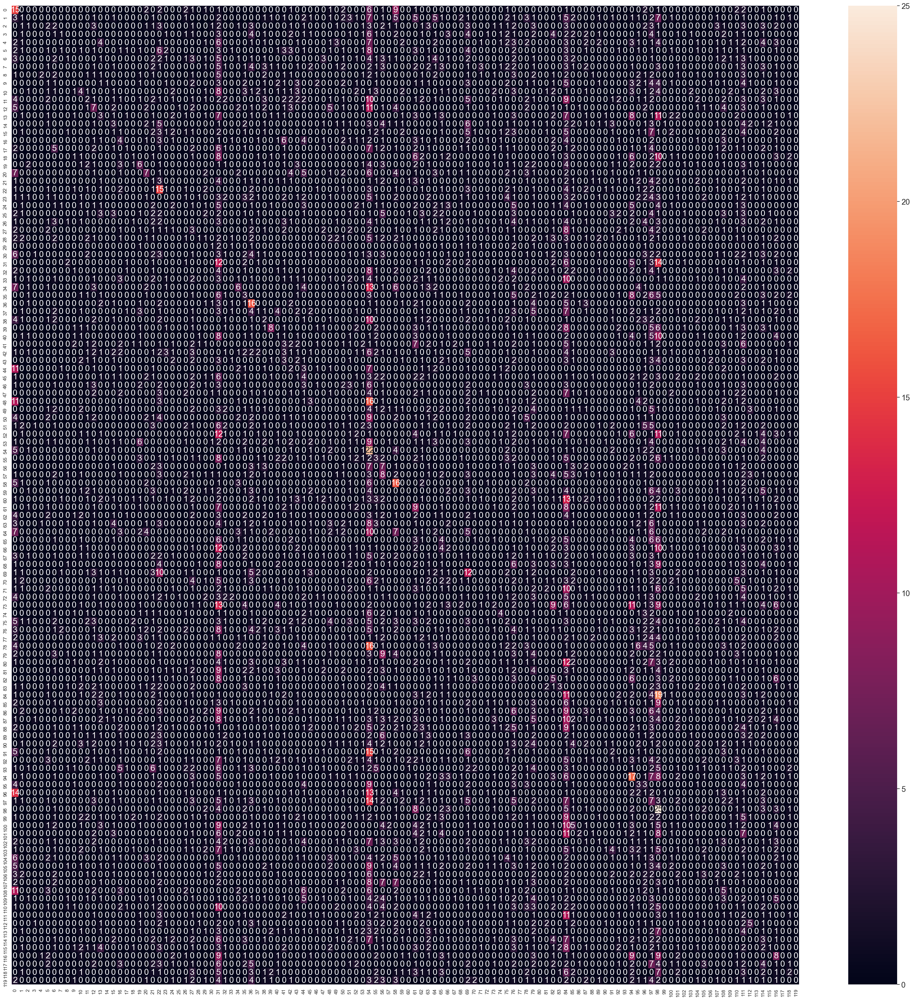

In [40]:
cm = confusion_matrix(y_test, predicitions)

fig, ax = plt.subplots(figsize=(40,40))         # Sample figsize in inches
sns.set(font_scale=1.6)
sns.heatmap(cm, annot=True, ax=ax)
  
plt.show()  

Idealy at 100% accuracy we would like to see the whole diognal in light color and the rest black for now we see a picture that is quite chaotic <br>
Hopefuly with can improve in the future using more advanced techniques 

We can see that we got 4 precent accuracy which is quite bad, now will try to improve the acuuracy by adding gabor features

## Gabor + SVM

Before we tried to use the whole dataset and we run into memory issues now we will only use the number of imgages in the smallest category

We have 216 images in the smallest category so now we will reduce the amount of images in all of the categories to 216

In [19]:
from sklearn.utils import shuffle
equal_df = shuffle(df)
equal_df = equal_df.groupby('lbl').head(216)
equal_df.reset_index(inplace=True)

Basically gabor filter analyze whether there is any specific frequency content in the image in specific directions in a localized region around the point or region of analysis.

No we will show an exampale of a gabor filter we can see that in the second picture we blur the whole image and only see the faces

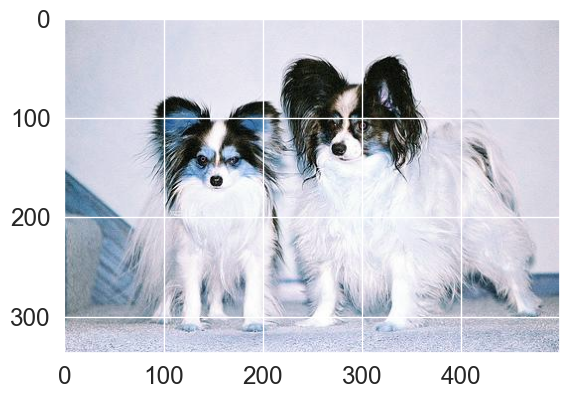

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


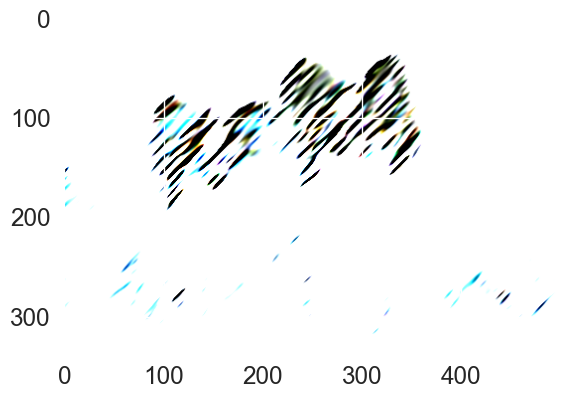

In [42]:
ksize = 50  #Use size that makes sense to the image and fetaure size. Large may not be good. 
#On the synthetic image it is clear how ksize affects imgae (try 5 and 50)
sigma = 3 #Large sigma on small features will fully miss the features. 
theta = 1*np.pi/4  #/4 shows horizontal 3/4 shows other horizontal. Try other contributions
lamda = 1*np.pi /4  #1/4 works best for angled. 
gamma=0.4  #Value of 1 defines spherical. Calue close to 0 has high aspect ratio
#Value of 1, spherical may not be ideal as it picks up features from other regions.
phi = 0  #Phase offset. I leave it to 0. 


kernel = cv2.getGaborKernel((ksize, ksize), sigma, theta, lamda, gamma, phi, ktype=cv2.CV_32F)

plt.imshow(kernel)


img = cv2.imread(equal_df['path_img'][310])
fimg = cv2.filter2D(img, cv2.COLOR_RGB2BGR, kernel)

kernel_resized = cv2.resize(kernel, (128, 128))                    # Resize image
plt.imshow(img)
plt.show()
plt.imshow(fimg)
plt.show()

Now we will resize the images to size 64 by 64 because of memory restrictions and extract five sets of differnt gabor features.

In [ ]:
SIZE = 64 # Resizing images
gabor_df = pd.DataFrame()
for index, row in equal_df.iterrows():
    img = cv2.imread(row["path_img"], cv2.IMREAD_COLOR) #Reading color images
    img = cv2.resize(img, (SIZE, SIZE)) #Resize images
     
    temp_df =  pd.DataFrame() 
    num = 1  #To count numbers up in order to give Gabor features a lable in the data frame
    kernels = []
    for theta in range(2):   #Define number of thetas
        theta = theta / 4. * np.pi
        for sigma in (1, 3):  #Sigma with 1 and 3
            lamda = np.pi/4
            gamma = 0.5
            gabor_label = 'Gabor' + str(num)  #Label Gabor columns as Gabor1, Gabor2, etc.
            ksize=25
            kernel = cv2.getGaborKernel((ksize, ksize), sigma, theta, lamda, gamma, 0, ktype=cv2.CV_32F)    
            kernels.append(kernel)
            fimg = cv2.filter2D(img, cv2.CV_8UC3, kernel)
            filtered_img = fimg.reshape(-1)
            temp_df[gabor_label] = filtered_img  #Labels columns as Gabor1, Gabor2, etc.
            num += 1  #Increment for gabor column label
    temp_df = temp_df.values.reshape(-1)
    
    gabor_df = gabor_df.append(pd.DataFrame(temp_df).T,ignore_index=True)

In [44]:
gabor_df['lbl'] = equal_df['lbl']
X = gabor_df.drop('lbl',axis = 1)
y = equal_df['lbl']

In [45]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

In [46]:
X_train = X_train.div(255.)
X_train.head()

,0,1,2,3,4,5,6,7,8,9,...,49142,49143,49144,49145,49146,49147,49148,49149,49150,49151
2237,0.223529,0.0,1.000000,0.000000,0.301961,0.0,1.00000,0.000000,0.501961,0.000000,...,1.000000,1.000000,1.000000,1.000000,1.0,1.000000,1.000000,1.000000,1.0,1.000000
8900,0.262745,0.0,0.862745,0.713725,0.529412,0.0,1.00000,0.858824,0.309804,0.011765,...,1.000000,0.000000,1.000000,0.305882,1.0,1.000000,0.956863,0.003922,1.0,0.647059
21961,0.203922,0.0,0.725490,0.000000,0.203922,0.0,0.72549,0.000000,0.203922,0.000000,...,0.415686,0.172549,0.792157,0.392157,1.0,0.439216,0.988235,0.529412,1.0,0.831373
7793,0.274510,0.0,1.000000,0.682353,0.396078,0.0,1.00000,1.000000,0.435294,0.000000,...,0.682353,0.274510,0.415686,0.054902,1.0,0.643137,0.768627,0.000000,1.0,1.000000
11832,0.835294,0.0,1.000000,1.000000,0.909804,0.0,1.00000,1.000000,0.976471,0.000000,...,1.000000,0.447059,0.666667,0.219608,1.0,0.431373,0.600000,0.062745,1.0,0.396078


We will try to use support vector machines on our data for classification.

![alt text](multiclass_svm.jpg)

In [47]:
from sklearn import svm
SVM_model = svm.SVC(decision_function_shape='ovo')  #For multiclass classification
SVM_model.fit(X_train, y_train)

SVC(decision_function_shape='ovo')

In [48]:
X_test = X_test.div(255.)
X_test.head()

,0,1,2,3,4,5,6,7,8,9,...,49142,49143,49144,49145,49146,49147,49148,49149,49150,49151
10296,1.000000,0.015686,1.000000,1.000000,1.000000,0.039216,1.0,1.000000,1.000000,0.035294,...,1.0,1.00000,1.000000,0.062745,1.0,1.0,1.000000,0.149020,1.0,1.0
8362,0.792157,0.000000,1.000000,0.784314,0.945098,0.000000,1.0,0.980392,1.000000,0.000000,...,1.0,1.00000,1.000000,0.000000,1.0,1.0,1.000000,0.000000,1.0,1.0
6223,0.325490,0.121569,0.921569,0.137255,0.427451,0.239216,1.0,0.321569,0.592157,0.188235,...,1.0,0.00000,0.658824,0.000000,1.0,0.0,1.000000,0.000000,1.0,0.0
8843,0.482353,1.000000,1.000000,0.000000,0.400000,1.000000,1.0,0.141176,0.529412,1.000000,...,1.0,0.87451,0.403922,0.482353,1.0,1.0,0.541176,0.435294,1.0,1.0
13487,1.000000,0.301961,1.000000,1.000000,0.745098,0.070588,1.0,0.717647,0.200000,0.078431,...,1.0,1.00000,0.913725,0.078431,1.0,1.0,0.650980,0.192157,1.0,1.0


In [49]:
predicitions = SVM_model.predict(X_test)

In [50]:
from sklearn import metrics 
print ("Accuracy = ", metrics.accuracy_score(y_test, predicitions))

Accuracy =  0.2462756052141527


We got 25% accuracy which is better than for but still not enough and we think we can do much better

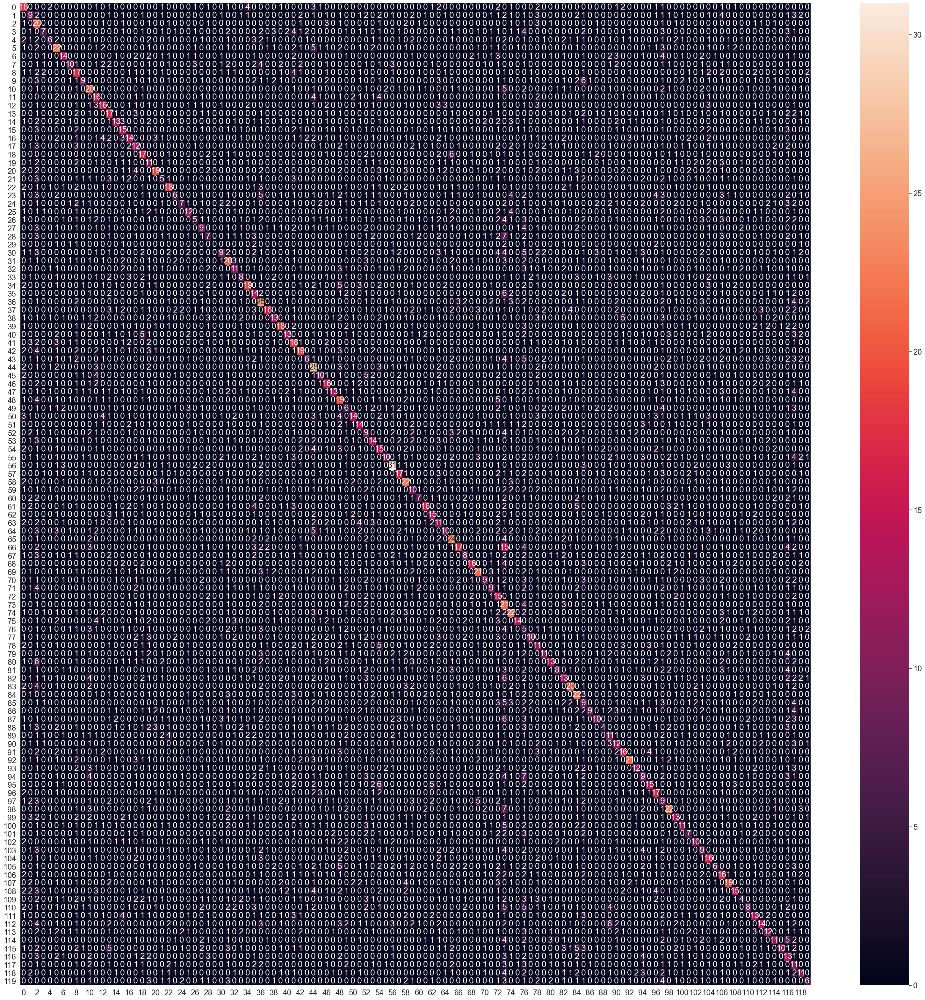

In [51]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, predicitions)

fig, ax = plt.subplots(figsize=(40,40))         # Sample figsize in inches
sns.set(font_scale=1.6)
sns.heatmap(cm, annot=True, ax=ax)
  
plt.show()  

Here we can see that a diognal is starting to form but still it is not enough for us.

## Gabor + Random Fotest

We will also try with a Random forest

![alt text](random_forest.jpg)

In [52]:
from sklearn.ensemble import RandomForestClassifier
RF_model = RandomForestClassifier(n_estimators = 50, random_state = 42)
RF_model.fit(X_train, y_train)

RandomForestClassifier(n_estimators=50, random_state=42)

In [53]:
predictions_rf = RF_model.predict(X_test)

In [54]:
print ("Accuracy = ", metrics.accuracy_score(y_test, predictions_rf))

Accuracy =  0.44661700806952204


We got 44% accuracy which is even better than the svm approach 

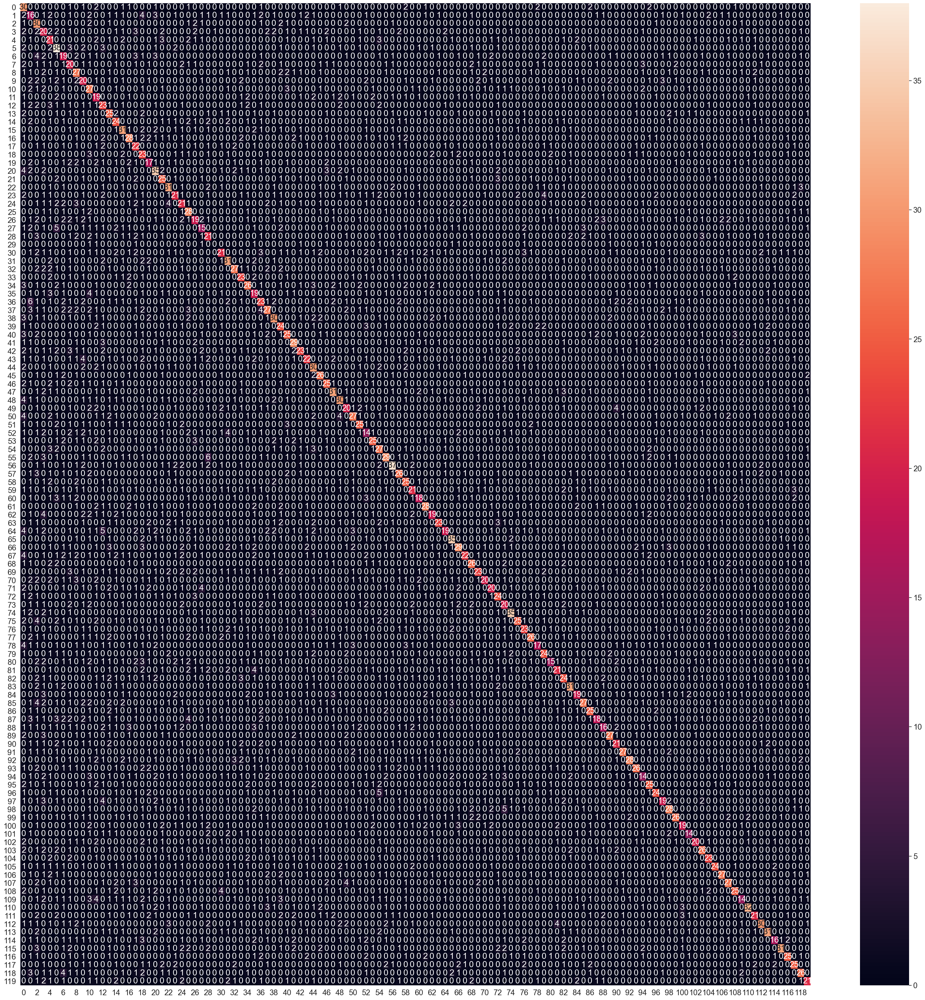

In [55]:
cm = confusion_matrix(y_test, predictions_rf)

fig, ax = plt.subplots(figsize=(40,40))         # Sample figsize in inches
sns.set(font_scale=1.6)
sns.heatmap(cm, annot=True, ax=ax)
  
plt.show()  

## Transfer Leanrning

We will now use a pretrained VGG-16 NN on our images and extract the last layers as features and the use ML aloritms on the extracted features

![alt text](vgg_16.jpg "Title")

Extracting features with VGG-16

In [21]:
from keras.preprocessing import image
from keras.applications.vgg16 import VGG16
from keras.applications.vgg16 import preprocess_input

model_vgg16 = VGG16(weights='imagenet', include_top=False)
model_vgg16.summary()
vgg16_feature_list = []
for index, row in df.iterrows():
        img_path = row['path_img']
        img = image.load_img(img_path, target_size=(224, 224))
        img_data = image.img_to_array(img)
        img_data = np.expand_dims(img_data, axis=0)
        img_data = preprocess_input(img_data)

        vgg16_feature = model_vgg16.predict(img_data)
        vgg16_feature_np = np.array(vgg16_feature)
        vgg16_feature_list.append(vgg16_feature_np.flatten())
vgg16_feature_list_np = np.array(vgg16_feature_list)



Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, None, None, 3)]   0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, None, None, 64)    1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, None, None, 64)    36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, None, None, 64)    0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, None, None, 128)   73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, None, None, 128)   147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, None, None, 128)   0     

In [ ]:
y_vgg = df['lbl']

### VGG_16 + Random Forest 100 estimators

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(vgg16_feature_list_np, y_vgg, test_size=0.25, random_state=42)

In [25]:
from sklearn.ensemble import RandomForestClassifier
RF_model_vgg = RandomForestClassifier(n_estimators = 100, random_state = 42)
RF_model_vgg.fit(X_train, y_train)

RandomForestClassifier(random_state=42)

In [26]:
predictions_rf_vgg = RF_model_vgg.predict(X_test)

In [30]:
print ("Accuracy = ", metrics.accuracy_score(y_test, predictions_rf_vgg))

Accuracy =  0.7320892600809082


Wow with VGG_16 + radom forest with 100 estimators we got 73 precent

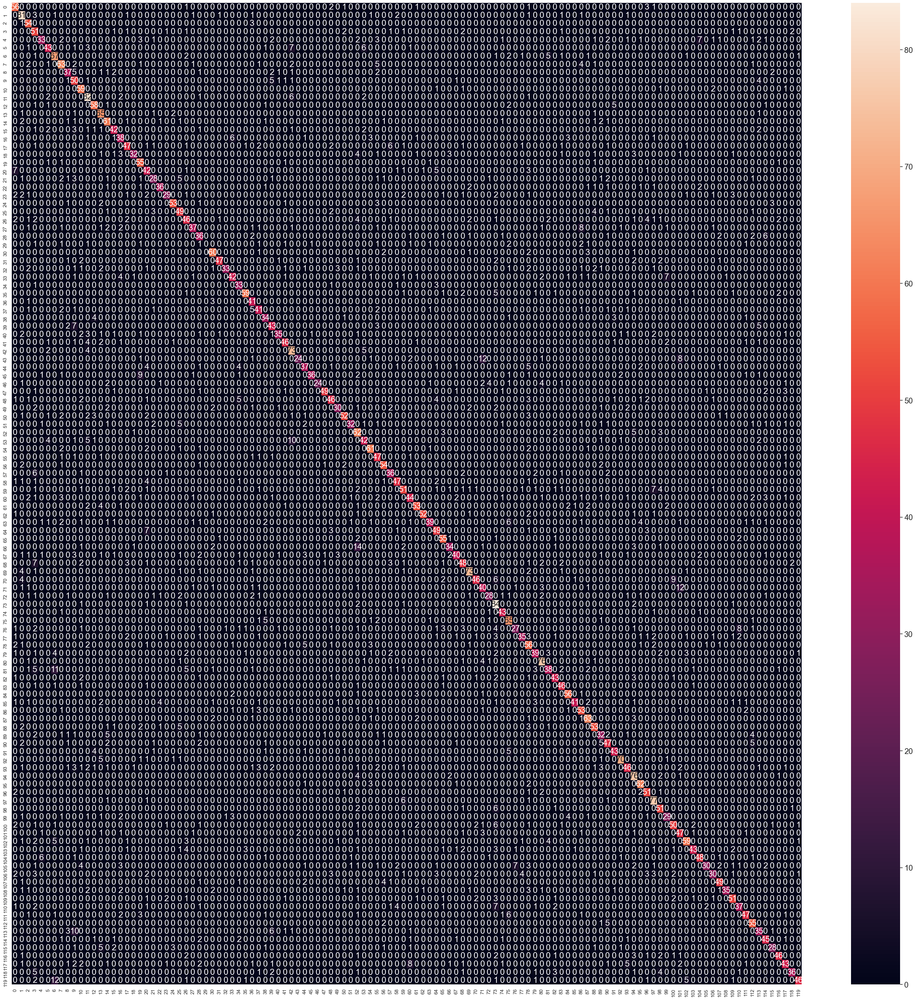

In [31]:
cm = confusion_matrix(y_test, predictions_rf_vgg)

fig, ax = plt.subplots(figsize=(40,40))         # Sample figsize in inches
sns.set(font_scale=1.6)
sns.heatmap(cm, annot=True, ax=ax)
  
plt.show()  

Looks much better with each run we are getting better and better results the diognal looks much more defined 

Lets also see how we are doing per category

In [32]:
cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

cm.diagonal()
i = 0
for result in cm.diagonal():
    print(str(i) +'. ' 'Acuracy for: ' + str(labels[i]) +'=' +str(result))
    i+=1

0. Acuracy for: affenpinscher=0.8484848484848485
1. Acuracy for: afghan_hound=0.84375
2. Acuracy for: african_hunting_dog=0.9310344827586207
3. Acuracy for: airedale=0.7727272727272727
4. Acuracy for: american_staffordshire_terrier=0.5076923076923077
5. Acuracy for: appenzeller=0.6825396825396826
6. Acuracy for: australian_terrier=0.8072289156626506
7. Acuracy for: basenji=0.75
8. Acuracy for: basset=0.6727272727272727
9. Acuracy for: beagle=0.7692307692307693
10. Acuracy for: bedlington_terrier=0.9076923076923077
11. Acuracy for: bernese_mountain_dog=0.8541666666666666
12. Acuracy for: black-and-tan_coonhound=0.8285714285714286
13. Acuracy for: blenheim_spaniel=0.9027777777777778
14. Acuracy for: bloodhound=0.8133333333333334
15. Acuracy for: bluetick=0.7368421052631579
16. Acuracy for: border_collie=0.6909090909090909
17. Acuracy for: border_terrier=0.6911764705882353
18. Acuracy for: borzoi=0.6037735849056604
19. Acuracy for: boston_bull=0.9016393442622951
20. Acuracy for: bouvier_d

### VGG_16 + Random Forest 200 estimators

We will also try with 200 and 

In [34]:
RF_model_vgg_200 = RandomForestClassifier(n_estimators = 200, random_state = 42)
RF_model_vgg_200.fit(X_train, y_train)

RandomForestClassifier(n_estimators=200, random_state=42)

In [35]:
predictions_rf_vgg_200 = RF_model_vgg_200.predict(X_test)

In [36]:
print ("Accuracy = ", metrics.accuracy_score(y_test, predictions_rf_vgg_200))

Accuracy =  0.7568837269998695


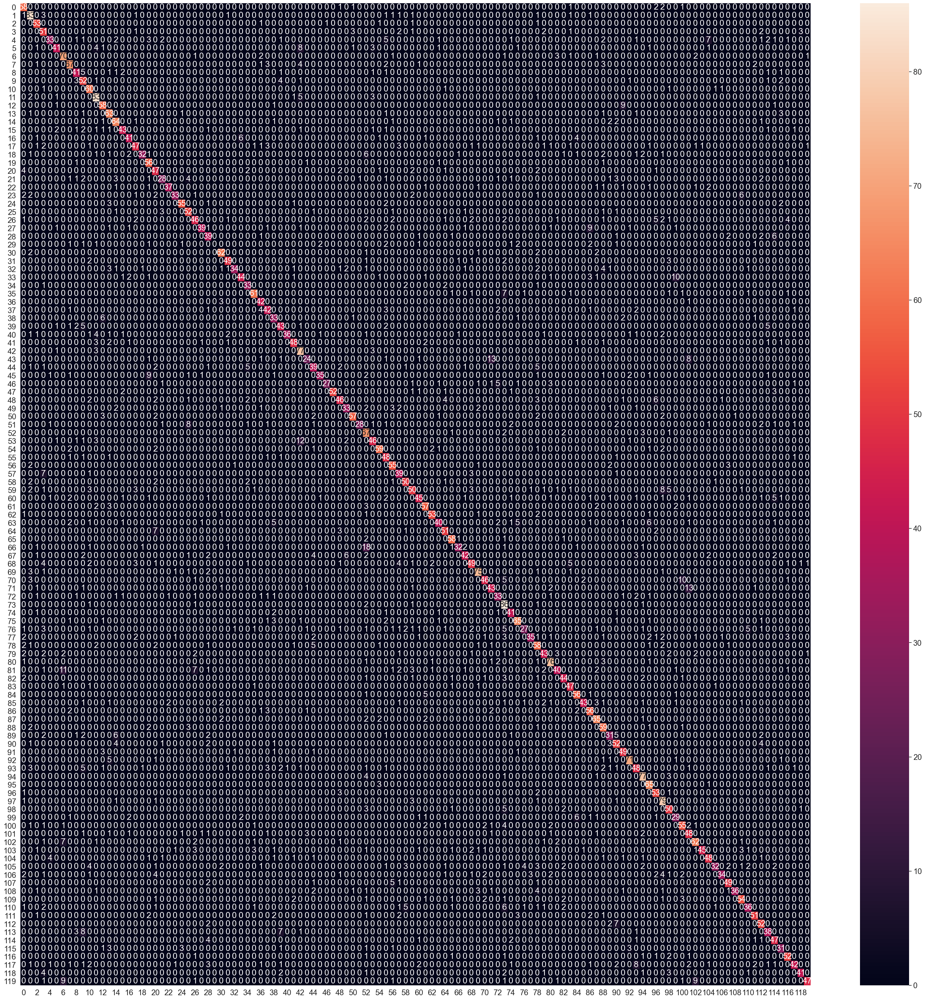

In [37]:
cm = confusion_matrix(y_test, predictions_rf_vgg_200)

fig, ax = plt.subplots(figsize=(40,40))         # Sample figsize in inches
sns.set(font_scale=1.6)
sns.heatmap(cm, annot=True, ax=ax)
  
plt.show()  

### VGG_16 + Random Forest 400 estimators

In [38]:
RF_model_vgg_400 = RandomForestClassifier(n_estimators = 400, random_state = 42)
RF_model_vgg_400.fit(X_train, y_train)

RandomForestClassifier(n_estimators=400, random_state=42)

In [39]:
predictions_rf_vgg_400 = RF_model_vgg_400.predict(X_test)

In [ ]:
y_test

In [48]:
print ("Accuracy = ", metrics.accuracy_score(y_test, predictions_rf_vgg_400))

Accuracy =  0.7754143285919353


We can see that with more estimators we are doing much better but the more we increas the amount of estimators the amount of imporvement is less and less

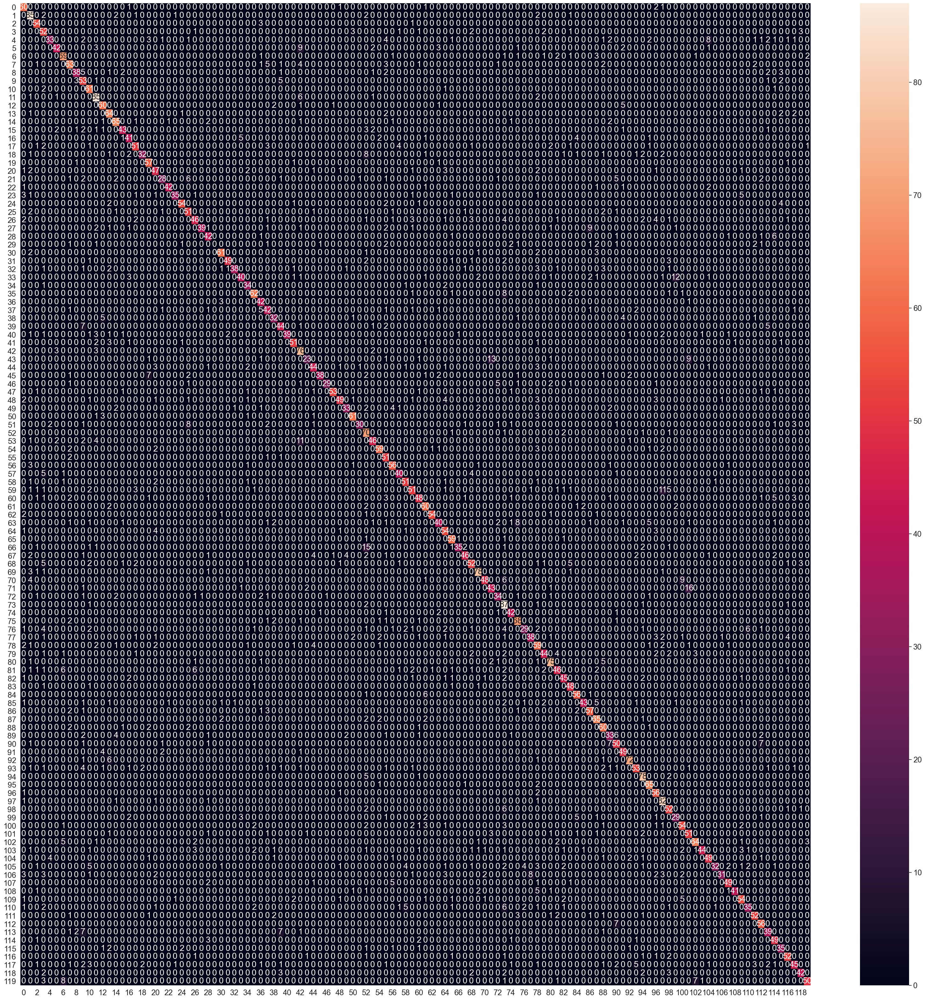

In [49]:
cm_400 = confusion_matrix(y_test, predictions_rf_vgg_400)

fig, ax = plt.subplots(figsize=(40,40))         # Sample figsize in inches
sns.set(font_scale=1.6)
sns.heatmap(cm_400, annot=True, ax=ax)
  
plt.show()  

In [50]:
#Now the normalize the diagonal entries
cm_400 = cm_400.astype('float') / cm_400.sum(axis=1)[:, np.newaxis]

cm_400.diagonal()
i = 0
for result in cm_400.diagonal():
    print(str(i) +'. ' 'Acuracy for: ' + str(labels[i]) +'=' +str(result))
    i+=1

0. Acuracy for: affenpinscher=0.9090909090909091
1. Acuracy for: afghan_hound=0.8854166666666666
2. Acuracy for: african_hunting_dog=0.9310344827586207
3. Acuracy for: airedale=0.7878787878787878
4. Acuracy for: american_staffordshire_terrier=0.5076923076923077
5. Acuracy for: appenzeller=0.6666666666666666
6. Acuracy for: australian_terrier=0.8313253012048193
7. Acuracy for: basenji=0.75
8. Acuracy for: basset=0.6909090909090909
9. Acuracy for: beagle=0.8153846153846154
10. Acuracy for: bedlington_terrier=0.9384615384615385
11. Acuracy for: bernese_mountain_dog=0.8854166666666666
12. Acuracy for: black-and-tan_coonhound=0.8571428571428571
13. Acuracy for: blenheim_spaniel=0.8888888888888888
14. Acuracy for: bloodhound=0.8666666666666667
15. Acuracy for: bluetick=0.7543859649122807
16. Acuracy for: border_collie=0.7454545454545455
17. Acuracy for: border_terrier=0.75
18. Acuracy for: borzoi=0.6037735849056604
19. Acuracy for: boston_bull=0.9344262295081968
20. Acuracy for: bouvier_des_

We can look at the heatmap and see that eskimo_dog where classified 26% of the time as malamute, and they are indeed look very simillar.

We indeed suspected that whould happen becauuse the dogs are reallly simillar

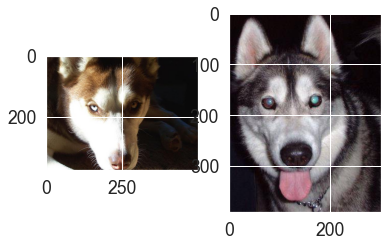

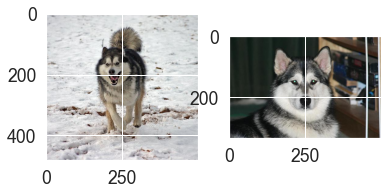

In [157]:
from sklearn.utils import shuffle 
i = 1
f = plt.figure()
df_copy = shuffle(df)
for index,row in df_copy.loc[df_copy['breed'] == 'eskimo_dog'].head(2).iterrows():
    f.add_subplot(1,2, i)
    i+=1
    plt.imshow(mpimg.imread(row['path_img']))
i= 1
f = plt.figure()
for index,row in df_copy.loc[df_copy['breed'] == 'malamute'].head(2).iterrows():
    f.add_subplot(1,2, i)
    i+=1
    plt.imshow(mpimg.imread(row['path_img']))
    

In [52]:
import pickle
filename = 'RF_model_vgg_400.sav'
pickle.dump(RF_model_vgg_400, open(filename, 'wb'))

### VGG_16 + XGBoost

In [43]:
from xgboost import XGBClassifier
XGB_classifier = XGBClassifier()
XGB_classifier.fit(X_train, y_train)

C:\Users\katunv\anaconda3\envs\dognewenv\lib\site-packages\xgboost\sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[13:56:37] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=4, num_parallel_tree=1,
              objective='multi:softprob', random_state=0, reg_alpha=0,
              reg_lambda=1, scale_pos_weight=None, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [44]:
predictions_XGB_vgg = XGB_classifier.predict(X_test)

In [45]:
print ("Accuracy = ", metrics.accuracy_score(y_test, predictions_XGB_vgg))

Accuracy =  0.7245204228109096


With XGboost we got slighly less accurate results even though it trained for much longer. <br> Maybe we could increase the amount of estimators but we decided to try something else as the trainig time is very long.

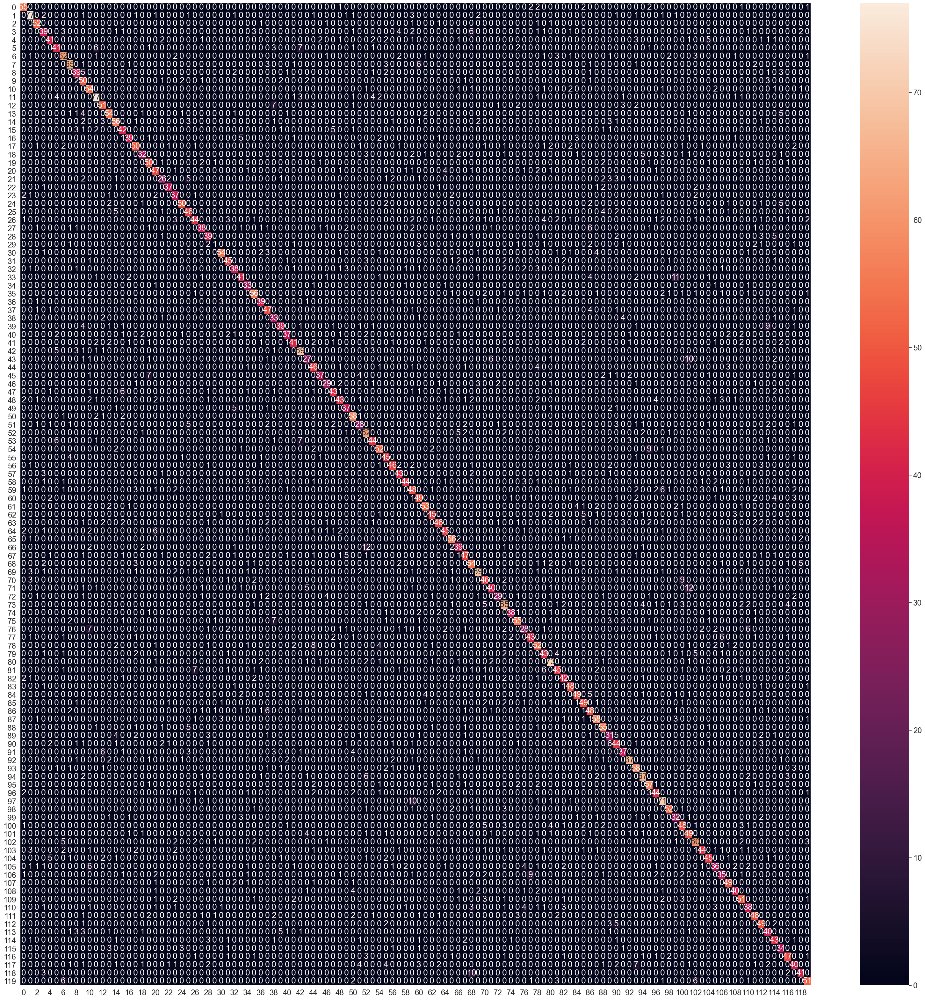

In [46]:
cm = confusion_matrix(y_test, predictions_XGB_vgg)

fig, ax = plt.subplots(figsize=(40,40))         # Sample figsize in inches
sns.set(font_scale=1.6)
sns.heatmap(cm, annot=True, ax=ax)
  
plt.show()  

In [54]:
filename = 'XGB_classifier.sav'
pickle.dump(XGB_classifier, open(filename, 'wb'))

# Neural Networks

Now we will reorganize the data for easier access from Imagedatagenerator

In [75]:
from sklearn.utils import shuffle 
df = shuffle(df)

Create directory for every breed

In [76]:
for breed in df['breed']:
    mkdirIfNotExist(os.path.join(TRAIN_PATH, breed))
    mkdirIfNotExist(os.path.join(VALID_PATH, breed))

Copy all Images to its corresponding directory

In [ ]:
for breed in df['breed']:
  train_ratio = 0.8
  fnames = df[df['breed'] == breed]['path_img']
  idx = int(len(fnames)*(1-train_ratio))
  val_fnames = fnames[:idx]
  train_fnames = fnames[idx:]
  copyIfNotExist(train_fnames, KAGGLE_PATH, os.path.join(TRAIN_PATH,breed))
  copyIfNotExist(val_fnames, KAGGLE_PATH, os.path.join(VALID_PATH,breed))

## With Data Augmantation

We are using data augmantation to artificially expand the size of a training dataset by creating modified versions of images in the dataset

In [86]:
from keras.preprocessing.image import ImageDataGenerator
img_width ,img_height= 224, 224
batch_size = 16

train_datagen = ImageDataGenerator(

    rescale=1./255,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    horizontal_flip=True,
    shear_range=0.1,
    zoom_range=0.15
)
test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
        TRAIN_PATH,
        target_size=(img_width, img_height),
        batch_size=batch_size,
        class_mode='categorical')
total_train_image_count = train_generator.samples
class_count = train_generator.num_classes

validation_generator = test_datagen.flow_from_directory(
        VALID_PATH,
        target_size=(img_width, img_height),
        batch_size=batch_size,
        class_mode='categorical',
        shuffle=False)
total_val_image_count = train_generator.samples

Found 24592 images belonging to 120 classes.
Found 6058 images belonging to 120 classes.


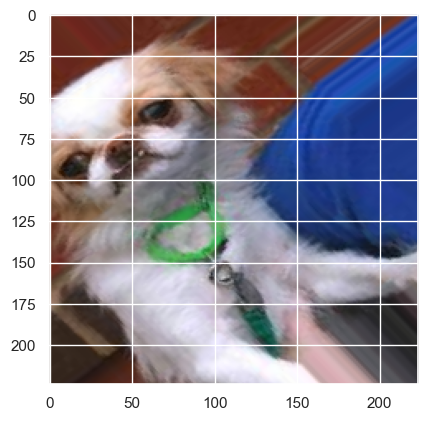

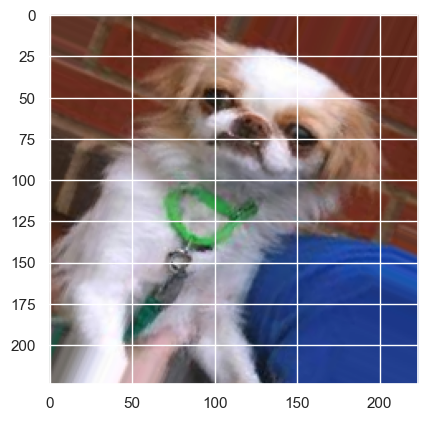

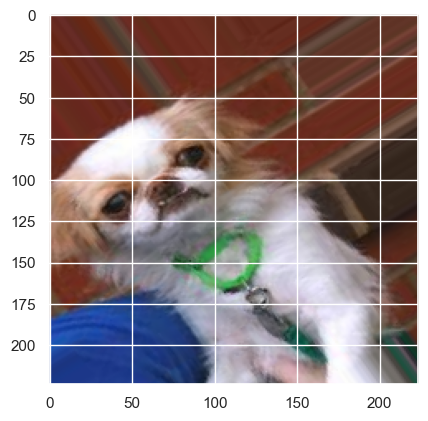

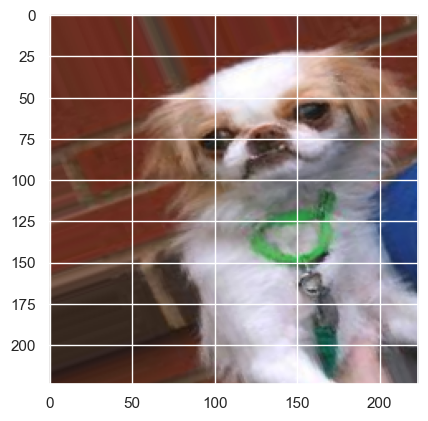

In [81]:
import matplotlib.pyplot as plt

train_first_dir = os.path.join(TRAIN_PATH, df['breed'][180])
fnames = [os.path.join(train_first_dir, fname) for fname in os.listdir(train_first_dir)]

img_path = fnames[4]
img = image.load_img(img_path, target_size=(img_width, img_height))
x = image.img_to_array(img)
x = x.reshape((1,) + x.shape)

i = 0
for batch in train_datagen.flow(x, batch_size=1):
    plt.figure(i)
    imgplot = plt.imshow(image.array_to_img(batch[0]))
    i += 1
    if i % 4 == 0:
        break

plt.show()

We can see that after we apply the augmantation the dog image is rotated, zoomed and sheared in different ways <br> This allows us to get more from less data <br>
It alows us to give the model slightly diffrent data for each epoch to avoid overfitting

### First CNN

We will first try our own CNN and see if a simple CNN can accuretly predict the dog breeds


Here we define a neural network with 7 convolution layers and one fully connected one

In [82]:
from keras import layers, models, regularizers, optimizers
from keras.models import Sequential,  Model
from keras.layers import Dense, Conv2D, MaxPool2D , Flatten,Dropout
from keras.layers.normalization import BatchNormalization

model_1 = Sequential()
model_1.add(Conv2D(input_shape=(img_height,img_height,3),filters=32,kernel_size=(3,3),padding="same", activation="relu"))
model_1.add(BatchNormalization())

model_1.add(Conv2D(filters=32, kernel_size=(3,3), padding="same", activation="relu"))
model_1.add(BatchNormalization())

model_1.add(Conv2D(filters=32, kernel_size=(3,3), padding="same", activation="relu"))
model_1.add(BatchNormalization())

model_1.add(Conv2D(filters=64, kernel_size=(3,3), padding="same", activation="relu"))
model_1.add(BatchNormalization())

model_1.add(Conv2D(filters=64, kernel_size=(3,3), padding="same", activation="relu"))
model_1.add(BatchNormalization())

model_1.add(Conv2D(filters=64, kernel_size=(3,3), padding="same", activation="relu"))
model_1.add(BatchNormalization())

model_1.add(Conv2D(filters=128, kernel_size=(3,3), padding="same", activation="relu"))
model_1.add(BatchNormalization())

model_1.add(MaxPool2D((2, 2)))

model_1.add(Flatten())
model_1.add(Dense(units=128,activation="relu"))
model_1.add(BatchNormalization())
model_1.add(Dense(class_count, activation="softmax"))

We are using the Agam optimizer

In [83]:
from keras.optimizers import Adam
from keras import optimizers
opt = Adam(lr=0.002)
model_1.compile(optimizer=opt, loss='categorical_crossentropy', metrics=['acc'])

C:\Users\katunv\anaconda3\envs\dognewenv\lib\site-packages\tensorflow\python\keras\optimizer_v2\optimizer_v2.py:374: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  warnings.warn(


In [84]:
model_1.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 224, 224, 32)      896       
_________________________________________________________________
batch_normalization (BatchNo (None, 224, 224, 32)      128       
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 224, 224, 32)      9248      
_________________________________________________________________
batch_normalization_1 (Batch (None, 224, 224, 32)      128       
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 224, 224, 32)      9248      
_________________________________________________________________
batch_normalization_2 (Batch (None, 224, 224, 32)      128       
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 224, 224, 64)      1

In [87]:
from time import strftime
steps_per_epoch = train_generator.samples / batch_size
validation_steps = validation_generator.samples / batch_size
history = model_1.fit_generator(
      train_generator,
      steps_per_epoch=steps_per_epoch,
      epochs=50,
      validation_data=validation_generator,
      validation_steps=validation_steps
)

C:\Users\katunv\anaconda3\envs\dognewenv\lib\site-packages\tensorflow\python\keras\engine\training.py:1940: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


Epoch 1/50
1537/1537 [==============================] - 480s 311ms/step - loss: 4.5783 - acc: 0.0314 - val_loss: 4.3067 - val_acc: 0.0589
Epoch 2/50
1537/1537 [==============================] - 477s 310ms/step - loss: 4.3881 - acc: 0.0479 - val_loss: 4.2238 - val_acc: 0.0632
Epoch 3/50
1537/1537 [==============================] - 475s 309ms/step - loss: 4.2766 - acc: 0.0586 - val_loss: 4.2613 - val_acc: 0.0621
Epoch 4/50
1537/1537 [==============================] - 475s 309ms/step - loss: 4.1518 - acc: 0.0732 - val_loss: 4.1453 - val_acc: 0.0759
Epoch 5/50
1537/1537 [==============================] - 474s 308ms/step - loss: 4.0092 - acc: 0.0917 - val_loss: 4.0407 - val_acc: 0.0948
Epoch 6/50
1537/1537 [==============================] - 474s 308ms/step - loss: 3.8972 - acc: 0.1077 - val_loss: 7.0275 - val_acc: 0.0461
Epoch 7/50
1537/1537 [==============================] - 474s 308ms/step - loss: 3.7879 - acc: 0.1258 - val_loss: 6.3568 - val_acc: 0.0703
Epoch 8/50
1537/1537 [============

<br> We trained for 50 epoch (The model has seen the data 50 times) and we see that the best accuracy on the validation set is at max 35% <br> Which is worse than our other models <br> 

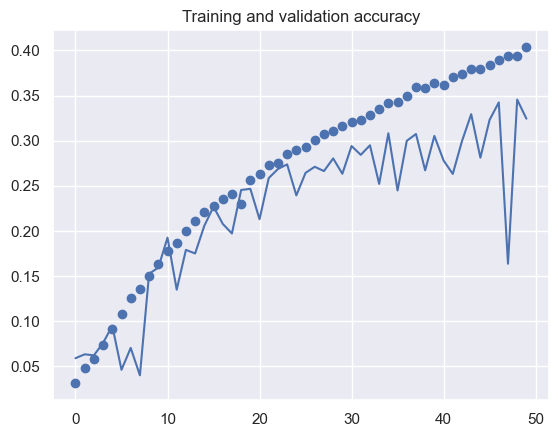

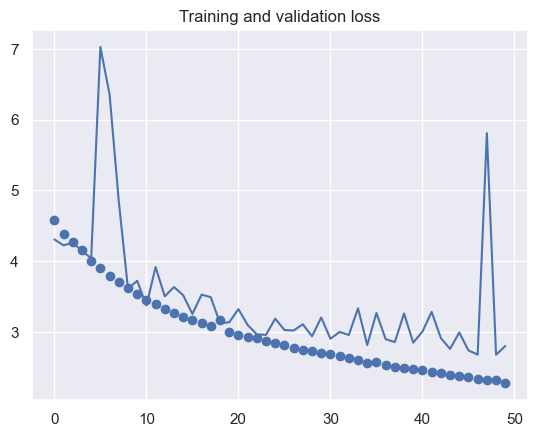

In [88]:
import matplotlib.pyplot as plt

acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'bo')
plt.plot(epochs, val_acc, 'b')
plt.title('Training and validation accuracy')

plt.figure()

plt.plot(epochs, loss, 'bo')
plt.plot(epochs, val_loss, 'b')
plt.title('Training and validation loss')

plt.show()

We can see that we are overfitting to the data as the training accuracy line (dotted) is diverging from the validation line (continuous)

In [108]:
Y_pred = model_1.predict_generator(validation_generator, validation_steps)
y_pred = np.argmax(Y_pred, axis=1)
cm_cnn = confusion_matrix(validation_generator.classes, y_pred)
print('Classification Report')

print(classification_report(validation_generator.classes, y_pred, target_names=labels.values()))

C:\Users\katunv\anaconda3\envs\dognewenv\lib\site-packages\tensorflow\python\keras\engine\training.py:2001: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  warnings.warn('`Model.predict_generator` is deprecated and '


Classification Report
                                precision    recall  f1-score   support

                 affenpinscher       0.39      0.16      0.22        45
                  afghan_hound       0.28      0.61      0.38        70
           african_hunting_dog       0.74      0.40      0.52        50
                      airedale       0.38      0.38      0.38        61
american_staffordshire_terrier       0.25      0.17      0.20        47
                   appenzeller       0.47      0.36      0.41        45
            australian_terrier       0.60      0.20      0.30        59
                       basenji       0.17      0.59      0.27        63
                        basset       0.15      0.08      0.10        51
                        beagle       0.26      0.19      0.22        59
            bedlington_terrier       0.43      0.46      0.45        54
          bernese_mountain_dog       0.65      0.55      0.60        66
       black-and-tan_coonhound       0.56

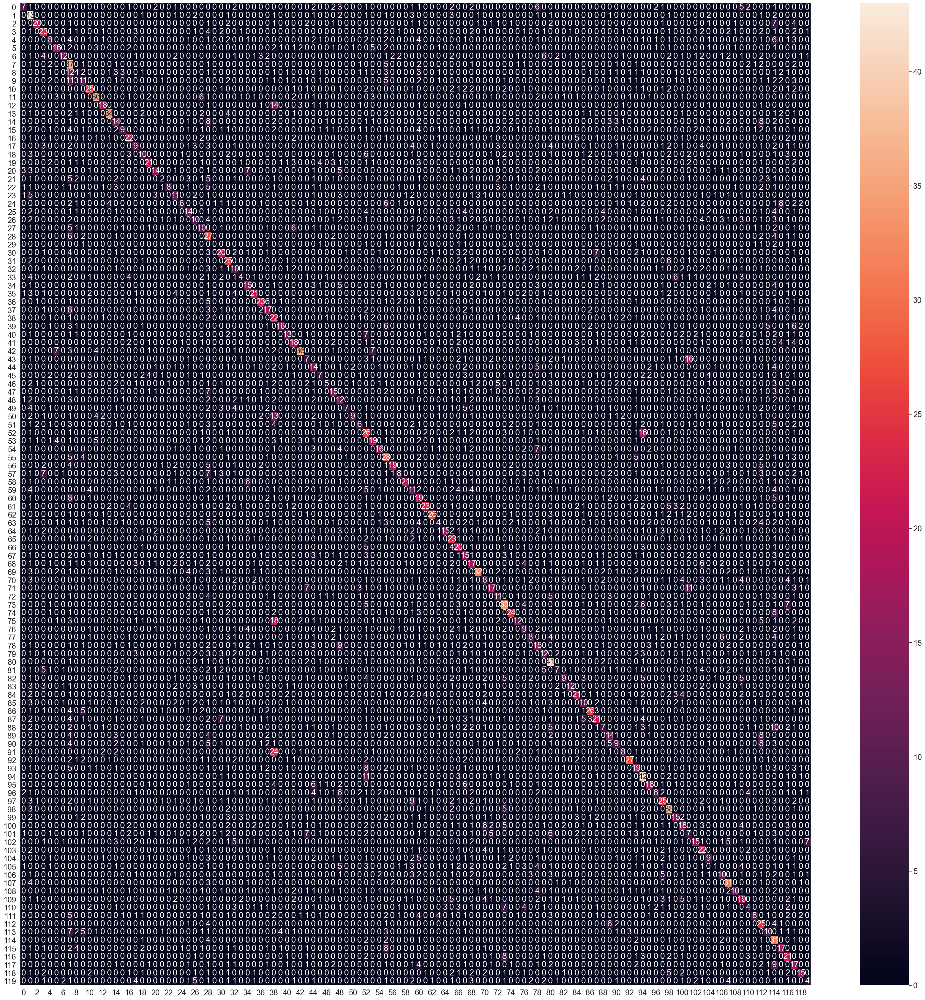

In [110]:
fig, ax = plt.subplots(figsize=(40,40))         # Sample figsize in inches
sns.set(font_scale=1.6)
sns.heatmap(cm_cnn, annot=True, ax=ax)
  
plt.show()  

### Xception

Using pretrained Xception network and then we finetune it on our own data

In [90]:
from keras.applications.xception import Xception

conv_base = Xception(weights='imagenet',
                     include_top=False,
                     input_shape=(img_width, img_height, 3))
conv_base.trainable = True

Defining the neural network. <br>
The first layers are the layers of the Xception network pretrained on imagenet, and then we have a fully connected layer with 512 nodes

In [91]:
from keras import layers, models, regularizers, optimizers
from keras.models import Sequential,  Model
from keras.layers import Flatten, Dense, Dropout

model_2 = models.Sequential()
model_2.add(conv_base)
model_2.add(layers.Flatten())
model_2.add(layers.Dense(512, activation='relu'))
model_2.add(layers.Dense(class_count, activation='sigmoid'))

model_2.compile(loss='categorical_crossentropy',
              optimizer=optimizers.SGD(lr=1e-4, momentum=0.90),
              metrics=['acc'])
model_2.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
xception (Functional)        (None, 7, 7, 2048)        20861480  
_________________________________________________________________
flatten_1 (Flatten)          (None, 100352)            0         
_________________________________________________________________
dense_2 (Dense)              (None, 512)               51380736  
_________________________________________________________________
dense_3 (Dense)              (None, 120)               61560     
Total params: 72,303,776
Trainable params: 72,249,248
Non-trainable params: 54,528
_________________________________________________________________


C:\Users\katunv\anaconda3\envs\dognewenv\lib\site-packages\tensorflow\python\keras\optimizer_v2\optimizer_v2.py:374: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  warnings.warn(


In [94]:
from time import strftime
from keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
earlyStopping = EarlyStopping(monitor='val_loss', patience=10, verbose=0, mode='min')
mcp_save = ModelCheckpoint('.mdl_wts.hdf5', save_best_only=True, monitor='val_loss', mode='min')
reduce_lr_loss = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=7, verbose=1, epsilon=1e-4, mode='min')
steps_per_epoch = train_generator.samples / 16
validation_steps = validation_generator.samples / 16
history_2 = model_2.fit_generator(
      train_generator,
      steps_per_epoch=steps_per_epoch,
      epochs=50,
      callbacks=[earlyStopping, mcp_save, reduce_lr_loss],
      validation_data=validation_generator,
      validation_steps=validation_steps
)

Epoch 1/50
1537/1537 [==============================] - 470s 306ms/step - loss: 1.0279 - acc: 0.7098 - val_loss: 0.6413 - val_acc: 0.8079


C:\Users\katunv\anaconda3\envs\dognewenv\lib\site-packages\tensorflow\python\keras\utils\generic_utils.py:494: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  warnings.warn('Custom mask layers require a config and must override '


Epoch 2/50
1537/1537 [==============================] - 472s 307ms/step - loss: 0.8877 - acc: 0.7394 - val_loss: 0.5820 - val_acc: 0.8206
Epoch 3/50
1537/1537 [==============================] - 471s 306ms/step - loss: 0.7905 - acc: 0.7679 - val_loss: 0.5447 - val_acc: 0.8331
Epoch 4/50
1537/1537 [==============================] - 526s 342ms/step - loss: 0.7315 - acc: 0.7787 - val_loss: 0.5222 - val_acc: 0.8453
Epoch 5/50
1537/1537 [==============================] - 576s 375ms/step - loss: 0.6695 - acc: 0.7970 - val_loss: 0.5120 - val_acc: 0.8415
Epoch 6/50
1537/1537 [==============================] - 553s 360ms/step - loss: 0.6241 - acc: 0.8097 - val_loss: 0.4876 - val_acc: 0.8526
Epoch 7/50
1537/1537 [==============================] - 580s 378ms/step - loss: 0.5721 - acc: 0.8223 - val_loss: 0.4794 - val_acc: 0.8521
Epoch 8/50
1537/1537 [==============================] - 563s 366ms/step - loss: 0.5514 - acc: 0.8289 - val_loss: 0.4662 - val_acc: 0.8585
Epoch 9/50
1537/1537 [============

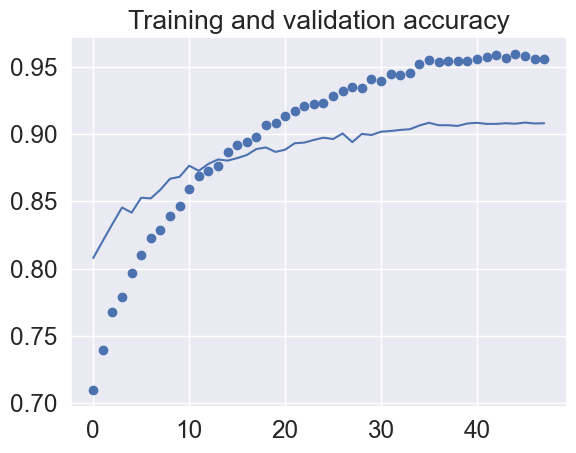

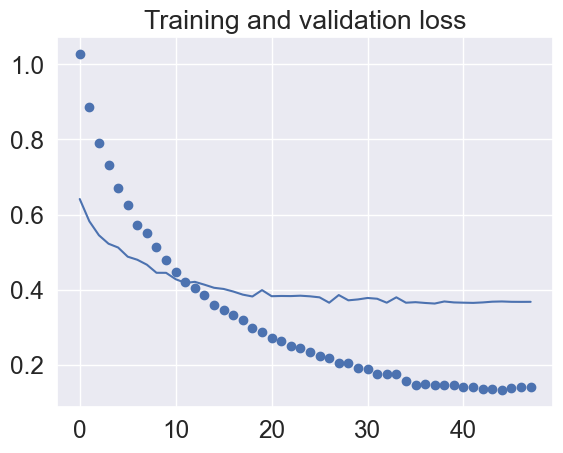

In [111]:
import matplotlib.pyplot as plt

acc = history_2.history['acc']
val_acc = history_2.history['val_acc']
loss = history_2.history['loss']
val_loss = history_2.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'bo')
plt.plot(epochs, val_acc, 'b')
plt.title('Training and validation accuracy')

plt.figure()

plt.plot(epochs, loss, 'bo')
plt.plot(epochs, val_loss, 'b')
plt.title('Training and validation loss')

plt.show()

In [112]:
Y_pred = model_2.predict_generator(validation_generator, validation_steps)
y_pred = np.argmax(Y_pred, axis=1)
cm_xception = confusion_matrix(validation_generator.classes, y_pred)
print('Classification Report')

print(classification_report(validation_generator.classes, y_pred, target_names=labels.values()))

C:\Users\katunv\anaconda3\envs\dognewenv\lib\site-packages\tensorflow\python\keras\engine\training.py:2001: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  warnings.warn('`Model.predict_generator` is deprecated and '


Classification Report
                                precision    recall  f1-score   support

                 affenpinscher       0.92      1.00      0.96        45
                  afghan_hound       0.93      0.97      0.95        70
           african_hunting_dog       0.98      1.00      0.99        50
                      airedale       0.92      0.89      0.90        61
american_staffordshire_terrier       0.77      0.77      0.77        47
                   appenzeller       0.83      0.78      0.80        45
            australian_terrier       0.85      0.90      0.88        59
                       basenji       0.98      0.90      0.94        63
                        basset       0.91      0.96      0.93        51
                        beagle       0.87      0.90      0.88        59
            bedlington_terrier       1.00      0.98      0.99        54
          bernese_mountain_dog       0.97      0.97      0.97        66
       black-and-tan_coonhound       0.94

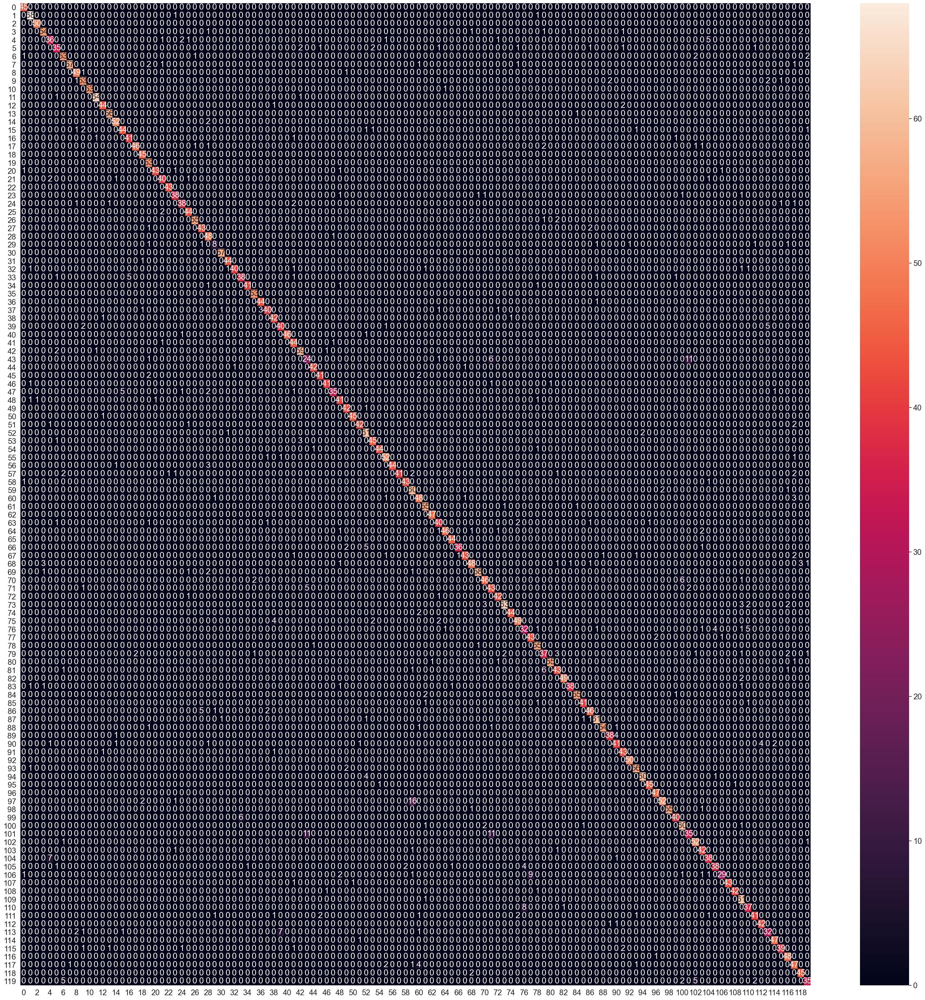

In [114]:
fig, ax = plt.subplots(figsize=(40,40))         # Sample figsize in inches
sns.set(font_scale=1.6)
sns.heatmap(cm_xception, annot=True, ax=ax)
  
plt.show()  

## Without data augmantation

In [22]:
from keras.preprocessing.image import ImageDataGenerator
img_width ,img_height= 224, 224
batch_size = 16

train_datagen = ImageDataGenerator(

    rescale=1./255,

)
test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
        TRAIN_PATH,
        target_size=(img_width, img_height),
        batch_size=batch_size,
        class_mode='categorical')
total_train_image_count = train_generator.samples
class_count = train_generator.num_classes

validation_generator = test_datagen.flow_from_directory(
        VALID_PATH,
        target_size=(img_width, img_height),
        batch_size=batch_size,
        class_mode='categorical',
        shuffle=False)
total_val_image_count = train_generator.samples

Found 24592 images belonging to 120 classes.
Found 6058 images belonging to 120 classes.


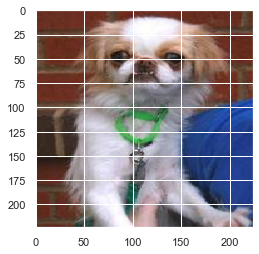

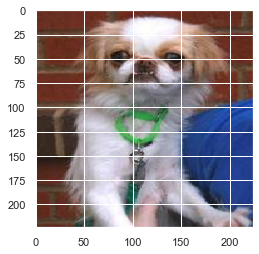

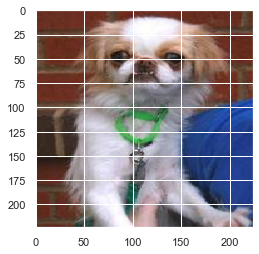

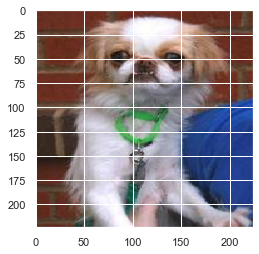

In [23]:
import matplotlib.pyplot as plt
from keras.preprocessing import image

train_first_dir = os.path.join(TRAIN_PATH, df['breed'][300])
fnames = [os.path.join(train_first_dir, fname) for fname in os.listdir(train_first_dir)]

img_path = fnames[4]
img = image.load_img(img_path, target_size=(img_width, img_height))
x = image.img_to_array(img)
x = x.reshape((1,) + x.shape)

i = 0
for batch in train_datagen.flow(x, batch_size=1):
    plt.figure(i)
    imgplot = plt.imshow(image.array_to_img(batch[0]))
    i += 1
    if i % 4 == 0:
        break

plt.show()

First lets try to classify first with classical machine learning

We will first try our own CNN and see if a simple CNN can accuretly predict the dog breeds


In [24]:
from keras import layers, models, regularizers, optimizers
from keras.models import Sequential,  Model
from keras.layers import Dense, Conv2D, MaxPool2D , Flatten,Dropout
from keras.layers.normalization import BatchNormalization

model_3  = Sequential()
model_3.add(Conv2D(input_shape=(img_height,img_height,3),filters=32,kernel_size=(3,3),padding="same", activation="relu"))
model_3.add(BatchNormalization())

model_3.add(Conv2D(filters=32, kernel_size=(3,3), padding="same", activation="relu"))
model_3.add(BatchNormalization())

model_3.add(Conv2D(filters=32, kernel_size=(3,3), padding="same", activation="relu"))
model_3.add(BatchNormalization())

model_3.add(Conv2D(filters=64, kernel_size=(3,3), padding="same", activation="relu"))
model_3.add(BatchNormalization())

model_3.add(Conv2D(filters=64, kernel_size=(3,3), padding="same", activation="relu"))
model_3.add(BatchNormalization())

model_3.add(Conv2D(filters=64, kernel_size=(3,3), padding="same", activation="relu"))
model_3.add(BatchNormalization())

model_3.add(Conv2D(filters=128, kernel_size=(3,3), padding="same", activation="relu"))
model_3.add(BatchNormalization())

model_3.add(MaxPool2D((2, 2)))

model_3.add(Flatten())
model_3.add(Dense(units=128,activation="relu"))
model_3.add(BatchNormalization())
model_3.add(Dense(class_count, activation="softmax"))

In [25]:
from keras.optimizers import Adam
from keras import optimizers
opt = Adam(lr=0.002)
model_3.compile(optimizer=opt, loss='categorical_crossentropy', metrics=['acc'])

In [26]:
model_3.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 224, 224, 32)      896       
_________________________________________________________________
batch_normalization (BatchNo (None, 224, 224, 32)      128       
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 224, 224, 32)      9248      
_________________________________________________________________
batch_normalization_1 (Batch (None, 224, 224, 32)      128       
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 224, 224, 32)      9248      
_________________________________________________________________
batch_normalization_2 (Batch (None, 224, 224, 32)      128       
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 224, 224, 64)      1

In [27]:
from time import strftime
steps_per_epoch = train_generator.samples / batch_size
validation_steps = validation_generator.samples / batch_size
history = model_3.fit_generator(
      train_generator,
      steps_per_epoch=steps_per_epoch,
      epochs=10,
      validation_data=validation_generator,
      validation_steps=validation_steps
)

Epoch 1/10
1537/1537 [==============================] - 464s 299ms/step - loss: 4.5414 - acc: 0.0426 - val_loss: 4.2907 - val_acc: 0.0723
Epoch 2/10
1537/1537 [==============================] - 459s 299ms/step - loss: 3.8637 - acc: 0.1452 - val_loss: 3.6797 - val_acc: 0.2025
Epoch 3/10
1537/1537 [==============================] - 459s 298ms/step - loss: 2.1860 - acc: 0.5168 - val_loss: 2.6595 - val_acc: 0.5074
Epoch 4/10
1537/1537 [==============================] - 458s 298ms/step - loss: 0.2050 - acc: 0.9643 - val_loss: 2.8876 - val_acc: 0.5586
Epoch 5/10
1537/1537 [==============================] - 459s 299ms/step - loss: 0.0453 - acc: 0.9958 - val_loss: 2.7426 - val_acc: 0.5644
Epoch 6/10
1537/1537 [==============================] - 458s 298ms/step - loss: 0.0416 - acc: 0.9956 - val_loss: 3.2863 - val_acc: 0.5598
Epoch 7/10
1537/1537 [==============================] - 458s 298ms/step - loss: 0.1239 - acc: 0.9713 - val_loss: 3.8647 - val_acc: 0.5322
Epoch 8/10
1537/1537 [============

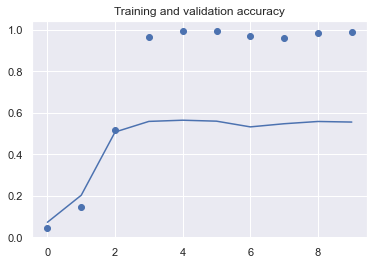

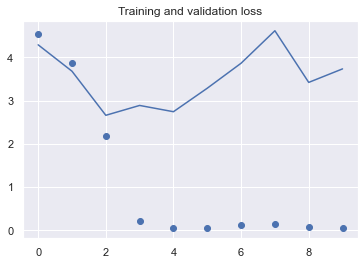

In [28]:
import matplotlib.pyplot as plt

acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'bo')
plt.plot(epochs, val_acc, 'b')
plt.title('Training and validation accuracy')

plt.figure()

plt.plot(epochs, loss, 'bo')
plt.plot(epochs, val_loss, 'b')
plt.title('Training and validation loss')

plt.show()

We can see that without data augmantation we are quickly overfitting to the data, after 3 epcohs we already reached 96 precent accuracy on the training data <br>
and only 50 on validation data, even though the results are better than the model with augmantation this model overfits and does not improve with epochs.

Using pretrained conv layer

In [30]:
from keras.applications.xception import Xception

conv_base = Xception(weights='imagenet',
                     include_top=False,
                     input_shape=(img_width, img_height, 3))
conv_base.trainable = True

defining the neural network

In [31]:
from keras import layers, models, regularizers, optimizers
from keras.models import Sequential,  Model
from keras.layers import Flatten, Dense, Dropout

model_4 = models.Sequential()
model_4.add(conv_base)
model_4.add(layers.Flatten())
model_4.add(layers.Dense(512, activation='relu'))
model_4.add(layers.Dense(class_count, activation='sigmoid'))

model_4.compile(loss='categorical_crossentropy',
              optimizer=optimizers.SGD(lr=1e-4, momentum=0.90),
              metrics=['acc'])
model_4.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
xception (Functional)        (None, 7, 7, 2048)        20861480  
_________________________________________________________________
flatten_2 (Flatten)          (None, 100352)            0         
_________________________________________________________________
dense_4 (Dense)              (None, 512)               51380736  
_________________________________________________________________
dense_5 (Dense)              (None, 120)               61560     
Total params: 72,303,776
Trainable params: 72,249,248
Non-trainable params: 54,528
_________________________________________________________________


In [32]:
from time import strftime
steps_per_epoch = train_generator.samples / batch_size
validation_steps = validation_generator.samples / batch_size
history = model_4.fit_generator(
      train_generator,
      steps_per_epoch=steps_per_epoch,
      epochs=50,
      validation_data=validation_generator,
      validation_steps=validation_steps
)

Epoch 1/50
1537/1537 [==============================] - 462s 297ms/step - loss: 1.6020 - acc: 0.6269 - val_loss: 0.6879 - val_acc: 0.8090
Epoch 2/50
1537/1537 [==============================] - 458s 298ms/step - loss: 0.6068 - acc: 0.8223 - val_loss: 0.5452 - val_acc: 0.8450
Epoch 3/50
1537/1537 [==============================] - 457s 297ms/step - loss: 0.4094 - acc: 0.8784 - val_loss: 0.4801 - val_acc: 0.8656
Epoch 4/50
1537/1537 [==============================] - 458s 298ms/step - loss: 0.2872 - acc: 0.9172 - val_loss: 0.4276 - val_acc: 0.8803
Epoch 5/50
1537/1537 [==============================] - 458s 298ms/step - loss: 0.2113 - acc: 0.9416 - val_loss: 0.3890 - val_acc: 0.8944
Epoch 6/50
1537/1537 [==============================] - 457s 297ms/step - loss: 0.1588 - acc: 0.9587 - val_loss: 0.3748 - val_acc: 0.8993
Epoch 7/50
1537/1537 [==============================] - 458s 298ms/step - loss: 0.1261 - acc: 0.9688 - val_loss: 0.3658 - val_acc: 0.9018
Epoch 8/50
1537/1537 [============

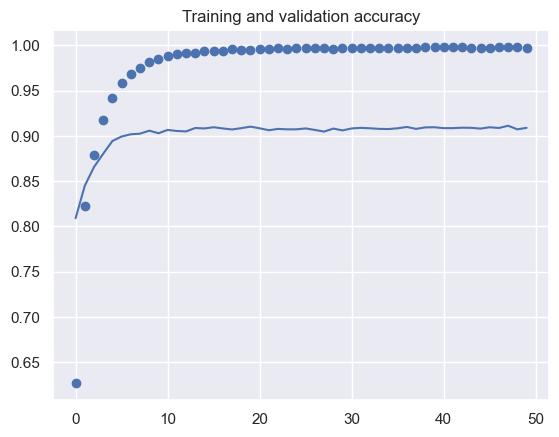

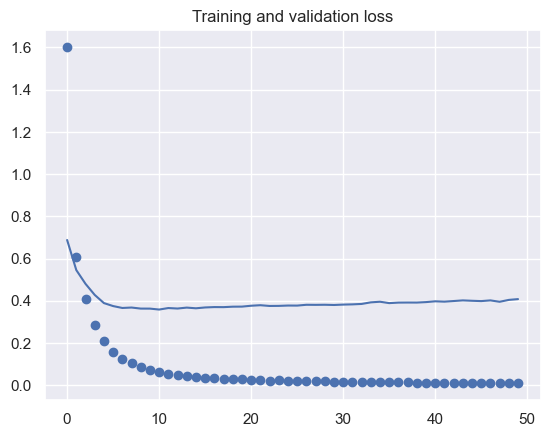

In [33]:
import matplotlib.pyplot as plt

acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'bo')
plt.plot(epochs, val_acc, 'b')
plt.title('Training and validation accuracy')

plt.figure()

plt.plot(epochs, loss, 'bo')
plt.plot(epochs, val_loss, 'b')
plt.title('Training and validation loss')

plt.show()

We can see that after 5 epochs we come close to the maximum validation accuracy, and we can see from the graph how quickly we overfit the data.
We think using data augmantation is better beacuse it allows us to not overfit the data and if we would want to deploy a model to a production application its better to have a model that has seen more data instead of one that saw the same data a bunch of times

# ViT transformer

After reading this paper: https://openreview.net/forum?id=YicbFdNTTy <br>
We decided to try a visual transformer approach. <br>
Historically the best performing models for image classification has been deep convolutional networks live ResNet Xception ...
This paper proposes a different approach that does not rely on the convolution operator.
Traditionaly this apptoach was used for NLP applications.

The steps are:
    Split an image into patches

    Flatten the patches

    Produce lower-dimensional linear embeddings from the flattened patches

    Add positional embeddings

    Feed the sequence as an input to a standard transformer encoder

    Pretrain the model with image labels (fully supervised on a huge dataset)

    Finetune on the downstream dataset for image classification

The main advatage of this approach is lower computational requirements

![alt text](ViT.png )

In [68]:
from keras.preprocessing.image import ImageDataGenerator
img_width ,img_height= 224, 224
batch_size = 32

train_datagen = ImageDataGenerator(

    rescale=1./255,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    horizontal_flip=True,
    shear_range=0.1,
    zoom_range=0.15
)
test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
        TRAIN_PATH,
        target_size=(img_width, img_height),
        batch_size=batch_size,
        class_mode='categorical')
total_train_image_count = train_generator.samples
class_count = train_generator.num_classes

validation_generator = test_datagen.flow_from_directory(
        VALID_PATH,
        target_size=(img_width, img_height),
        batch_size=batch_size,
        class_mode='categorical',
        shuffle=False)
total_val_image_count = train_generator.samples

Found 24592 images belonging to 120 classes.
Found 6058 images belonging to 120 classes.


We can already see here the advantages of ViT. <br>
We are using a simiilar image data generator as before but this time we can use a batch size of 32 <br> Before we could not do that as we did not have enough memory on the GPU

In [71]:
from vit_keras import vit

In [83]:
import tensorflow as tf
import tensorflow_addons as tfa

Downloading a pretrained ViT model (pretrained on imagenet)

In [72]:
vit_model = vit.vit_b32(
        image_size = img_width,
        activation = 'softmax',
        pretrained = True,
        include_top = False,
        pretrained_top = False,
        classes = 120)

353255424/353253686 [==============================] - 322s 1us/step


We will use the ViT model as the first layer followed by a fully connected one with 256 nodes.

In [84]:
model = tf.keras.Sequential([
        vit_model,
        tf.keras.layers.Flatten(),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Dense(256, activation = tfa.activations.gelu),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Dense(120, 'softmax')
    ],
    name = 'vision_transformer')

model.summary()

Model: "vision_transformer"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vit-b32 (Functional)         (None, 768)               87455232  
_________________________________________________________________
flatten_2 (Flatten)          (None, 768)               0         
_________________________________________________________________
batch_normalization_9 (Batch (None, 768)               3072      
_________________________________________________________________
dense_2 (Dense)              (None, 256)               196864    
_________________________________________________________________
batch_normalization_10 (Batc (None, 256)               1024      
_________________________________________________________________
dense_3 (Dense)              (None, 120)               30840     
Total params: 87,687,032
Trainable params: 87,684,984
Non-trainable params: 2,048
________________________________

Defining the learning rate then the optimizer. <br>
We also defined a dynamic learning rate which basically means that if we reach a plateau the learning rate will be decreased and try to improve even more. <br>
We defined early stopping which will stop the learing proccess if there was no improvement for 5 epochs. <br>
And also checkpoint to save the bast weights so far

In [85]:
learning_rate = 1e-4

optimizer = tfa.optimizers.RectifiedAdam(learning_rate = learning_rate)

model.compile(optimizer = optimizer, 
              loss = tf.keras.losses.CategoricalCrossentropy(label_smoothing = 0.2), 
              metrics = ['accuracy'])

steps_per_epoch = train_generator.samples / batch_size
validation_steps = validation_generator.samples / batch_size

reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor = 'val_accuracy',
                                                 factor = 0.2,
                                                 patience = 2,
                                                 verbose = 1,
                                                 min_delta = 1e-4,
                                                 min_lr = 1e-6,
                                                 mode = 'max')

earlystopping = tf.keras.callbacks.EarlyStopping(monitor = 'val_accuracy',
                                                 min_delta = 1e-4,
                                                 patience = 5,
                                                 mode = 'max',
                                                 restore_best_weights = True,
                                                 verbose = 1)

checkpointer = tf.keras.callbacks.ModelCheckpoint(filepath = './model.hdf5',
                                                  monitor = 'val_accuracy', 
                                                  verbose = 1, 
                                                  save_best_only = True,
                                                  mode = 'max')

callbacks = [earlystopping, reduce_lr, checkpointer]

model.fit_generator(train_generator,
          steps_per_epoch = steps_per_epoch,
          validation_data = validation_generator,
          validation_steps = validation_steps,
          epochs = 60,
          callbacks = callbacks)

model.save('model.h5', save_weights_only = True)

Epoch 1/60
768/768 [==============================] - 417s 480ms/step - loss: 3.6880 - accuracy: 0.3406 - val_loss: 2.3107 - val_accuracy: 0.7291

Epoch 00001: val_accuracy improved from -inf to 0.72912, saving model to .\model.hdf5
Epoch 2/60
768/768 [==============================] - 367s 477ms/step - loss: 2.4837 - accuracy: 0.6536 - val_loss: 2.2107 - val_accuracy: 0.7605

Epoch 00002: val_accuracy improved from 0.72912 to 0.76048, saving model to .\model.hdf5
Epoch 3/60
768/768 [==============================] - 367s 477ms/step - loss: 2.2974 - accuracy: 0.7121 - val_loss: 2.1648 - val_accuracy: 0.7763

Epoch 00003: val_accuracy improved from 0.76048 to 0.77633, saving model to .\model.hdf5
Epoch 4/60
768/768 [==============================] - 367s 478ms/step - loss: 2.1920 - accuracy: 0.7451 - val_loss: 2.1458 - val_accuracy: 0.7707

Epoch 00004: val_accuracy did not improve from 0.77633
Epoch 5/60
768/768 [==============================] - 367s 477ms/step - loss: 2.0734 - accura

TypeError: save() got an unexpected keyword argument 'save_weights_only'

In [88]:
Y_pred = model.predict_generator(validation_generator, validation_steps)
y_pred = np.argmax(Y_pred, axis=1)
cm_vig = confusion_matrix(validation_generator.classes, y_pred)
print('Classification Report')

print(classification_report(validation_generator.classes, y_pred, target_names=labels.values()))

Classification Report
                                precision    recall  f1-score   support

                 affenpinscher       0.98      0.91      0.94        45
                  afghan_hound       0.92      0.93      0.92        70
           african_hunting_dog       0.96      0.98      0.97        50
                      airedale       0.93      0.90      0.92        61
american_staffordshire_terrier       0.69      0.74      0.71        47
                   appenzeller       0.92      0.78      0.84        45
            australian_terrier       0.85      0.93      0.89        59
                       basenji       0.92      0.94      0.93        63
                        basset       0.82      0.96      0.88        51
                        beagle       0.89      0.83      0.86        59
            bedlington_terrier       0.96      0.96      0.96        54
          bernese_mountain_dog       0.90      0.97      0.93        66
       black-and-tan_coonhound       0.92

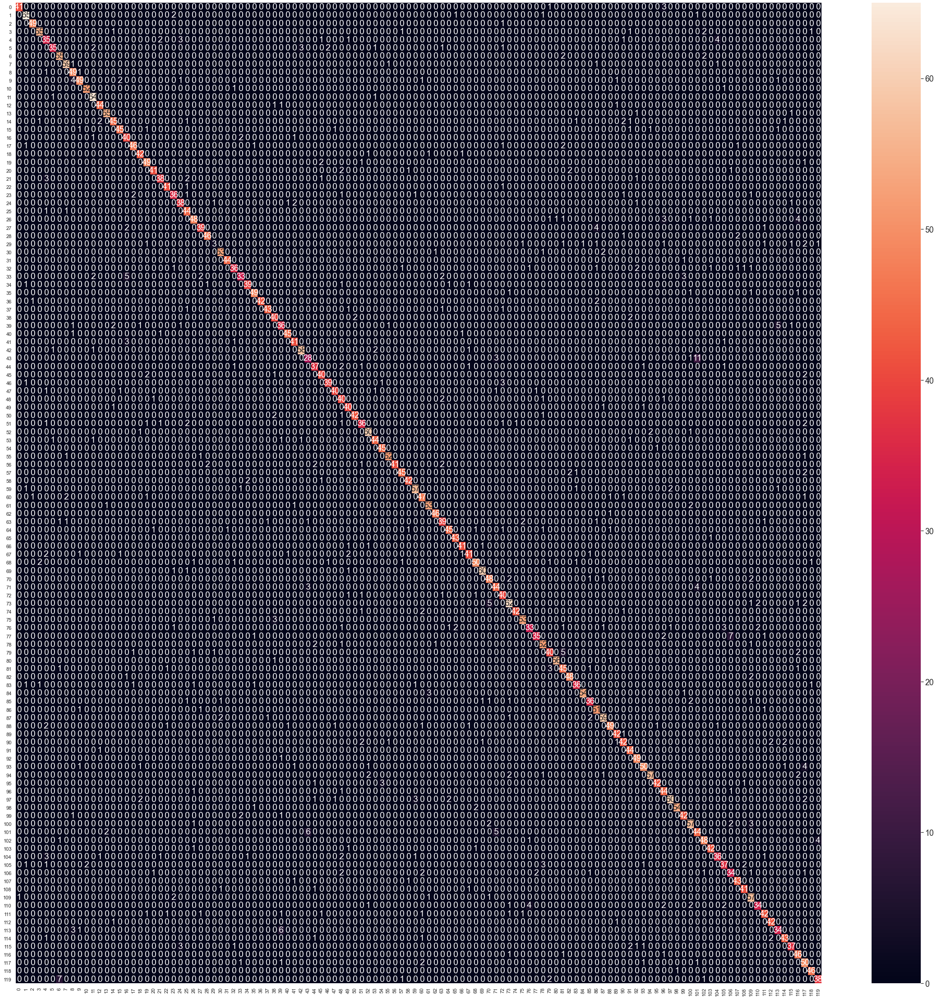

In [89]:
fig, ax = plt.subplots(figsize=(40,40))         # Sample figsize in inches
sns.set(font_scale=1.6)
sns.heatmap(cm_vig, annot=True, ax=ax)
  
plt.show()  

We can see that even though here we performed a little bit worse compared to the Xception network (90% vs 88%) the training took much less time (7 hours vs 2.5 hours) <br> <br>
And I think we could tune the hyper parameters of the ViT model more and perhaps match the results of the Xception network 

# Ideas For Improvement

1. We had a problem with Chihuahuas we noticed to late that half of the chihuahua pictures werenot copied to right directory and that would explain the low results we got for chihuhuas on all models. This was noticed late and we didnt have the time to retrain the models.

2. We could also try to add more data and see if we can improve the accuracy.

3. We didnt play to much with hyperparameters as learning times were really long sometimes even more the 15 hours, So in our opinion we maybe could improve some of the models.

4. We had an idea but didnt have the time to implement it of using a NN to locate the face of the dog on the image and crop the image aroud the face and use classification on that cropped image.

5. We did not use auto encoders perhaps the could have helped

# Conclusions

Results by model/algorithem


> <b>Naive Bayes -</b> As predicted its a very poor model but it was helpfull as a test for the first try with 4% accuracy. 3 hours training + 3 hours loading the data to a df

> <b>Gabor+SVM -</b> With gabor filters we got much better accuracy but still wasnt good enough with 24% accuracy. 3 hours training + 2 hours to prepare df

> <b>Gabor+Random Forest -</b> We got 44% accuracy which is even better than the svm approach. 1 hour training + 2 hours to prepare df

> <b>VGG-16 + Random forest 100-400 estimators</b> Using VGG-16 as fetature extractor and applying RF worked alot better than our previous models. (73%,75%,77%)
The fastest approaches took about 2 hours to train including feature extraction

> <b>VGG16 + XGBoost -</b> Another try with VGG16 and XGBoost performed worse then RFs with 72% accuracy. 15 hours 

> <b>Classic CNN with data augmantation -</b> We used a our own CNN which resulted with poor results at 34% accuracy. 7 hours 

> <b>Xception with data augmantation </b> This is a pretrained CNN worked much better with 91% accuracy. 7 hours 

> <b>Classic CNN without data augmantation -</b> Trained faster without augmantation but over fitted the data. 50% accuracy 7 hours 

> <b>Xception without data augmantation </b> Trained similarly as without aug. 90% accuracy 7 hours 

> <b>ViT with data augmantation </b> Trained much faster than exception got similar results. 88% accuracy 2.5 hours

# Struggles

1.   We wish we could have used better hardware,It was impossible to load all the images to a dataframe with high quality because of lack of memory. 
We tried using colab but the lack of mememory and constant disconnection made us swiftly change to our own hardware.
So we had to do it on our own hardware even then lack of memory and GPU power caused frequent computer crashes and long runtimes  made us do a lot adjusments.
2.   We were too ambitious to try using two diffrent datasets which raised alot of problems we had to fix before even starting to run the main algorithems on the data. Because of the size of the data we had memory issues and slow running times.


# Self reflection
Eran:
*   I must say this workshop taught me alot. This is my first taste of the "real" programming world and it was very intersting and fun. I am very fond of the data science field and would be very happy if I could work in it.
*   The project gave me alot of hard times, I had to learn the field from scratch and it was very time consuming for me but I enjoyed it very much.<br><br>
Andrey:
*   The project was very challenging and in the same time really rewarding. I learned a lot, and this small exposure to the DS field showed how much more there is to learn. I am excited to continue lerning. On the other side dealing with a lot of infrastucture issues was quite anoying like: keepping my computer cold, problems with conda packages and memory issues made it quite difficult. I think it would have been better to work on something like SageMaker.
*  I am really glad that i had the oppurtinity to do this workshop